In [3]:
suppressPackageStartupMessages({
    ## This is my custom library for various helper functions for spatial pre-processing 
    # devtools::install_github('korsunskylab/spatula', dependencies = FALSE)    
    # devtools::install_github('korsunskylab/spatula')
    library(purrr)
    library(furrr)
    library(future)
    library(dplyr)
    library(data.table)
    library(ggplot2)
    library(ggthemes)
    library(patchwork)
    library(Matrix)
    library(Seurat)
})

fig.size <- function(h, w) {
    options(repr.plot.height = h, repr.plot.width = w)
}



In [4]:
source('utils_plotting.R')
source('utils.R')

# Data

## Meta data 

In [11]:
fname = '/n/data1/bwh/medicine/korsunsky/lab/data/public/NSCLC_Lee_GSE131907/GSE131907_Lung_Cancer_Feature_Summary.xlsx'
lib_df <- readxl::read_xlsx(fname, skip = 2) %>% 
    subset(!is.na(`Patient id`))
head(lib_df)


No,Patient id,Samples,Tissue origins,Histology,Sex,Age,Smoking,Pathology,EGFR,Stages,No. of single-cells
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>
1,P0001,LUNG_N01,nLung,ADC,Female,70,Never,MD,WT,IA,3194
2,P0006,LUNG_N06,nLung,ADC,Male,54,Ex,MD,na,IA,2839
3,P0008,LUNG_N08,nLung,ADC,Female,60,Never,MD,L858R,IB,3380
4,P0009,LUNG_N09,nLung,ADC,Male,67,Ex,PD,WT,IIA,2528
5,P0018,LUNG_N18,nLung,ADC,Male,62,Ex,MD,del19,IA,4628
6,P0019,LUNG_N19,nLung,ADC,Male,53,Cur,WD,exon 20,IA,3870


In [12]:
table(lib_df$`Tissue origins`)


mBrain    mLN    nLN  nLung     PE   tL/B  tLung 
    10      7     10     11      5      4     11 

In [13]:
fname = '/n/data1/bwh/medicine/korsunsky/lab/data/public/NSCLC_Lee_GSE131907/GSE131907_Lung_Cancer_cell_annotation.txt'

cells_df <- fread(fname) %>% 
    dplyr::select(-Cell_type) %>% 
    dplyr::rename(Cell_type = Cell_type.refined)

In [14]:
head(cells_df)

Index,Barcode,Sample,Sample_Origin,Cell_type,Cell_subtype
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
AAACCTGCAAGGTGTG_LUNG_N01,AAACCTGCAAGGTGTG,LUNG_N01,nLung,Myeloid cells,mo-Mac
AACTCCCGTTCACCTC_LUNG_N01,AACTCCCGTTCACCTC,LUNG_N01,nLung,Myeloid cells,mo-Mac
AACTCCCTCACGCGGT_LUNG_N01,AACTCCCTCACGCGGT,LUNG_N01,nLung,Myeloid cells,mo-Mac
AAGGAGCGTGTGCGTC_LUNG_N01,AAGGAGCGTGTGCGTC,LUNG_N01,nLung,Myeloid cells,mo-Mac
AAGGTTCAGGTACTCT_LUNG_N01,AAGGTTCAGGTACTCT,LUNG_N01,nLung,Myeloid cells,mo-Mac
ACACCAAAGTGTACGG_LUNG_N01,ACACCAAAGTGTACGG,LUNG_N01,nLung,Myeloid cells,mo-Mac


In [15]:
unique(cells_df$Sample_Origin)

[1] "nLung"  "tLung"  "tL/B"   "nLN"    "mLN"    "PE"     "mBrain"

In [16]:
unique(cells_df$Cell_type)

[1] "Myeloid cells"     "T/NK cells"        "B lymphocytes"    
[4] "Fibroblasts"       "Endothelial cells" "MAST cells"       
[7] "Epithelial cells"  NA

In [17]:
unique(cells_df$Cell_subtype)

[1] "mo-Mac"                "Monocytes"             "Alveolar Mac"         
 [4] "Pleural Mac"           "CD1c+ DCs"             "CD141+ DCs"           
 [7] "pDCs"                  "CD163+CD14+ DCs"       "Activated DCs"        
[10] "Cytotoxic CD8+ T"      "Exhausted CD8+ T"      "Naive CD8+ T"         
[13] "CD8 low T"             "Naive CD4+ T"          "Treg"                 
[16] "CD4+ Th"               "NK"                    "GrB-secreting B cells"
[19] "MALT B cells"          "Follicular B cells"    "COL13A1+ matrix FBs"  
[22] "Smooth muscle cells"   "Tip-like ECs"          "Stalk-like ECs"       
[25] "Lymphatic ECs"         "MAST"                  "AT1"                  
[28] "AT2"                   "Ciliated"              "Club"                 
[31] "Undetermined"          NA                      "Plasma cells"         
[34] "COL14A1+ matrix FBs"   "Mesothelial cells"     "Exhausted Tfh"        
[37] "Pericytes"             "Tumor ECs"             "EPCs"                 
[40] "Myofibroblasts"        "CD8+/CD4+ Mixed Th"    "CD207+CD1a+ LCs"      
[43] "GC B cells in the DZ"  "FB-like cells"         "tS1"                  
[46] "tS2"                   "tS3"                   "GC B cells in the LZ" 
[49] "Malignant cells"       "Microglia/Mac"

In [18]:
cells_df %>% 
    split(.$Cell_type) %>% 
    map(function(x) table(x$Cell_subtype))

$`B lymphocytes`

   Follicular B cells  GC B cells in the DZ  GC B cells in the LZ 
                22089                   476                   373 
GrB-secreting B cells          MALT B cells          Plasma cells 
                  205                  2420                  1236 
         Undetermined 
                  858 

$`Endothelial cells`

          EPCs  Lymphatic ECs Stalk-like ECs   Tip-like ECs      Tumor ECs 
            75            289            427            822            494 

$`Epithelial cells`

            AT1             AT2        Ciliated            Club Malignant cells 
            530            2020             654             439           24784 
            tS1             tS2             tS3    Undetermined 
           3270            3018              64              60 

$Fibroblasts

COL13A1+ matrix FBs COL14A1+ matrix FBs       FB-like cells   Mesothelial cells 
                982                1470                 201                  35 
  

## Counts

In [11]:
# genes_merfish <- fread('../../data/VizgennsclcNirdata/lung//Lung005/hybrid_hub_regions/spatial_outputs/assignments_per_gene.csv')$gene
# genes_merfish <- toupper(genes_merfish)
# genes_merfish <- genes_merfish[!grepl('BLANK', genes_merfish)]

In [5]:
fname = '/n/data1/bwh/medicine/korsunsky/lab/data/public/NSCLC_Lee_GSE131907/GSE131907_Lung_Cancer_raw_UMI_matrix.rds'
counts <- readRDS(fname)
# counts <- counts[intersect(genes_merfish, rownames(counts)), ]
counts <- as(as.matrix(counts), 'dgCMatrix')

## Remove low count cells 

In [20]:
cells_df$nUMI <- colSums(counts)
cells_df$nGene <- colSums(counts > 0)


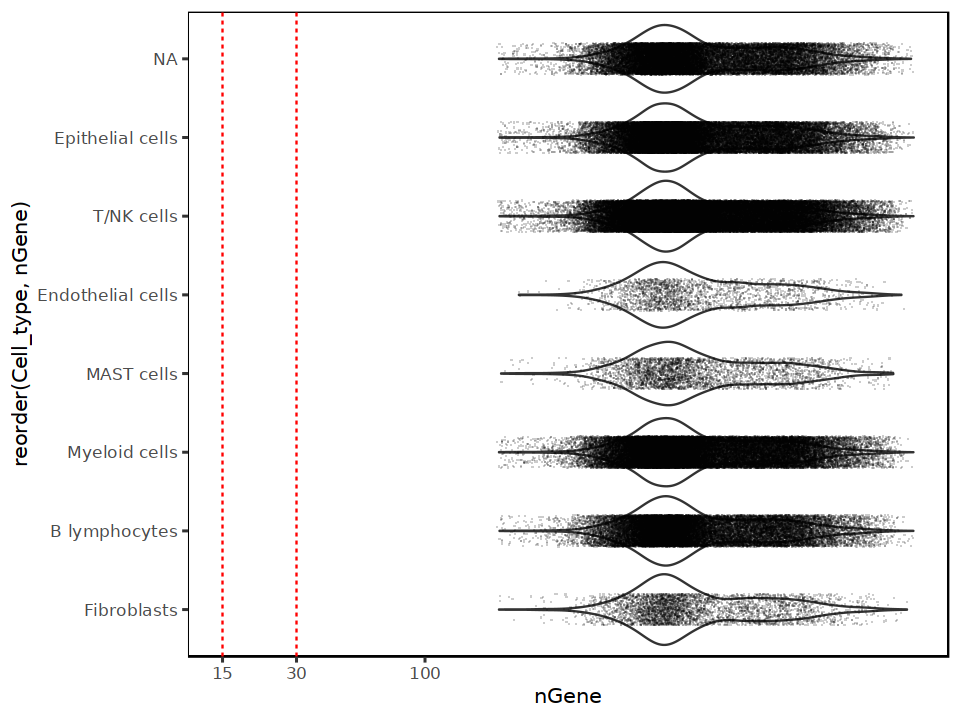

In [21]:
fig.size(6, 8)
cells_df %>% 
    # ggplot(aes(reorder(Cell_type, nGene), nGene)) + 
    ggplot(aes(reorder(Cell_type, nGene), nGene)) + 
        geom_violin(fill = NA) + 
        geom_jitter(shape = '.', width = .2, height = .01, alpha = .2) + 
        geom_hline(yintercept = c(15, 30), linetype = 2, color = 'red') + 
        scale_y_continuous(trans = 'log10', breaks = c(1, 15, 30, 100)) + 
        coord_flip() + 
        NULL


In [22]:
cells_df %>% 
    split(.$Cell_type) %>% 
    map(function(x) quantile(x$nGene, .05))

$`B lymphocytes`
   5% 
573.8 

$`Endothelial cells`
   5% 
577.3 

$`Epithelial cells`
 5% 
575 

$Fibroblasts
    5% 
578.65 

$`MAST cells`
    5% 
565.75 

$`Myeloid cells`
 5% 
569 

$`T/NK cells`
 5% 
574

In [23]:
cells_df <- subset(cells_df, nGene >= 20)
counts <- counts[, cells_df$Index]


In [24]:
dim(counts)

[1]  29634 208506

## Remove unannotated cells 

In [18]:
# cells_df <- cells_df[which(!is.na(cells_df$Cell_type )), ]
# counts <- counts[, cells_df$Index]

## Remove non-tumor, non-solid tissue

In [26]:
samples_keep <- subset(lib_df, `Tissue origins` %in% c('tLung', 'tL/B'))$`Samples`
# samples_keep <- subset(lib_df, `Tissue origins` %in% c('tLung', 'tL/B', 'mLN', 'mBrain'))$`Samples`
cells_df <- cells_df[Sample %in% samples_keep]
counts <- counts[, cells_df$Index]


## Final result

In [27]:
dim(counts)

[1] 29634 57222

In [28]:
sort(table(cells_df$Sample))
table(cells_df$Sample_Origin)



   EBUS_49    EBUS_06 BRONCHO_58   LUNG_T34   LUNG_T06   LUNG_T18   LUNG_T08 
      1775       2303       2813       3280       3426       3705       3765 
  LUNG_T09   LUNG_T20   LUNG_T30   LUNG_T19   LUNG_T25   LUNG_T28    EBUS_28 
      3840       4021       4094       4361       4374       4705       5182 
  LUNG_T31 
      5578 


 tL/B tLung 
12073 45149 

In [29]:
head(cells_df)

Index,Barcode,Sample,Sample_Origin,Cell_type,Cell_subtype,nUMI,nGene
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>
AAACCTGAGTTGCAGG_LUNG_T06,AAACCTGAGTTGCAGG,LUNG_T06,tLung,Myeloid cells,mo-Mac,7211,1721
AAAGCAAGTAATTGGA_LUNG_T06,AAAGCAAGTAATTGGA,LUNG_T06,tLung,Myeloid cells,mo-Mac,3065,992
AAATGCCCATTACGAC_LUNG_T06,AAATGCCCATTACGAC,LUNG_T06,tLung,Myeloid cells,mo-Mac,2505,872
AACGTTGTCTTGTCAT_LUNG_T06,AACGTTGTCTTGTCAT,LUNG_T06,tLung,Myeloid cells,mo-Mac,3364,1081
AACTCAGAGGCTCATT_LUNG_T06,AACTCAGAGGCTCATT,LUNG_T06,tLung,Myeloid cells,mo-Mac,2178,1112
AACTCAGTCTTTAGTC_LUNG_T06,AACTCAGTCTTTAGTC,LUNG_T06,tLung,Myeloid cells,mo-Mac,4812,1433


## QC low expressed genes

In [30]:
genes_keep <- names(which(rowSums(counts >= 1) >= 10))
length(genes_keep)
counts <- counts[genes_keep, ]

[1] 22500

## Cache as Seurat

In [31]:
library(Seurat)
obj <- Seurat::CreateSeuratObject(
    counts = counts, 
    meta.data = tibble::column_to_rownames(data.frame(cells_df), 'Index')
)    


Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


In [32]:
obj

An object of class Seurat 
22500 features across 57222 samples within 1 assay 
Active assay: RNA (22500 features, 0 variable features)
 2 layers present: counts, data

In [33]:
head(obj@meta.data)

,orig.ident,Barcode,Sample,Sample_Origin,Cell_type,Cell_subtype,nUMI,nGene,nCount_RNA,nFeature_RNA
,<fct>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<dbl>,<int>
AAACCTGAGTTGCAGG_LUNG_T06,SeuratProject,AAACCTGAGTTGCAGG,LUNG_T06,tLung,Myeloid cells,mo-Mac,7211,1721,1695,711
AAAGCAAGTAATTGGA_LUNG_T06,SeuratProject,AAAGCAAGTAATTGGA,LUNG_T06,tLung,Myeloid cells,mo-Mac,3065,992,6779,1826
AAATGCCCATTACGAC_LUNG_T06,SeuratProject,AAATGCCCATTACGAC,LUNG_T06,tLung,Myeloid cells,mo-Mac,2505,872,24381,4356
AACGTTGTCTTGTCAT_LUNG_T06,SeuratProject,AACGTTGTCTTGTCAT,LUNG_T06,tLung,Myeloid cells,mo-Mac,3364,1081,8647,1952
AACTCAGAGGCTCATT_LUNG_T06,SeuratProject,AACTCAGAGGCTCATT,LUNG_T06,tLung,Myeloid cells,mo-Mac,2178,1112,7373,1987
AACTCAGTCTTTAGTC_LUNG_T06,SeuratProject,AACTCAGTCTTTAGTC,LUNG_T06,tLung,Myeloid cells,mo-Mac,4812,1433,6983,1800


In [34]:
saveRDS(obj, 'data/all_ref_lee_lung.rds')


# Get fibroblasts

## PCA etc. 

In [49]:
.verbose = TRUE
obj = obj %>% 
        Seurat::NormalizeData(scale.factor = median(obj@meta.data$nCount_RNA)) %>% 
        Seurat::FindVariableFeatures() %>% 
        Seurat::ScaleData(verbose = .verbose) %>% 
        Seurat::RunPCA(npcs = 30, verbose = .verbose) 


Warning message:
“The following arguments are not used: nselect”
Centering and scaling data matrix

PC_ 1 
Positive:  HLA-DPB1, ALOX5AP, HLA-DRB1, HLA-DPA1, TYROBP, LTB, CD69, GPR183, FCER1G, HLA-DRA 
	   HLA-DQA1, HLA-DQB1, AIF1, C1orf162, CCL4, IGKC, LYZ, LST1, CD68, HLA-DMB 
	   SPI1, C1QA, BCL2A1, C1QB, FCGR3A, NKG7, MS4A6A, APOC1, C1QC, LY86 
Negative:  KRT19, CLDN4, MUC1, KRT18, ELF3, KRT8, KRT7, MDK, WFDC2, MAL2 
	   GPRC5A, MGST1, S100A14, TACSTD2, SLC34A2, EPCAM, TM4SF1, CCND1, CEACAM6, CLDN3 
	   HSPB1, RAB25, FXYD3, SMIM22, NAPSA, SDC4, C8orf4, AGR3, SDC1, SLPI 
PC_ 2 
Positive:  OCIAD2, BIRC3, CLDN4, S100A14, LTB, KRT19, MAL2, MUC1, ELF3, KRT7 
	   SLC34A2, CD69, KRT8, KRT18, HOPX, PLPP2, SFN, FAM83A, RAB25, KRTCAP3 
	   NAPSA, SMIM22, WFDC2, PRSS8, ASS1, NKG7, EPCAM, LY6D, SLPI, SLC22A31 
Negative:  DCN, LUM, COL1A2, MMP2, BGN, A2M, FBLN1, C1S, RARRES2, SPARC 
	   COL6A2, SERPINF1, SERPING1, MFAP4, MGP, COL6A3, AEBP1, COL3A1, PCOLCE, IGFBP7 
	   C1R, CALD1, EMILIN1, COL6A1

In [51]:
plan(multicore)
system.time({
    U <- uwot::umap(obj@reductions$pca@cell.embeddings, min_dist = 0.3, spread = 1.0, ret_extra = 'fgraph', fast_sgd = TRUE, n_sgd_threads = 10)  
})

colnames(U$embedding) <- c('UMAP1', 'UMAP2')
rownames(U$fgraph) <- colnames(U$fgraph) <- Cells(obj)

obj[['umap']] <- Seurat::CreateDimReducObject(
    embeddings = U$embedding,
    assay = 'RNA', 
    key = 'UMAP_', 
    global = TRUE
)
new_graph <- Seurat::as.Graph(U$fgraph)
DefaultAssay(new_graph) <- DefaultAssay(obj)
obj[['umap_fgraph']] <- new_graph


   user  system elapsed 
 48.735   0.411  18.484 

## Plot

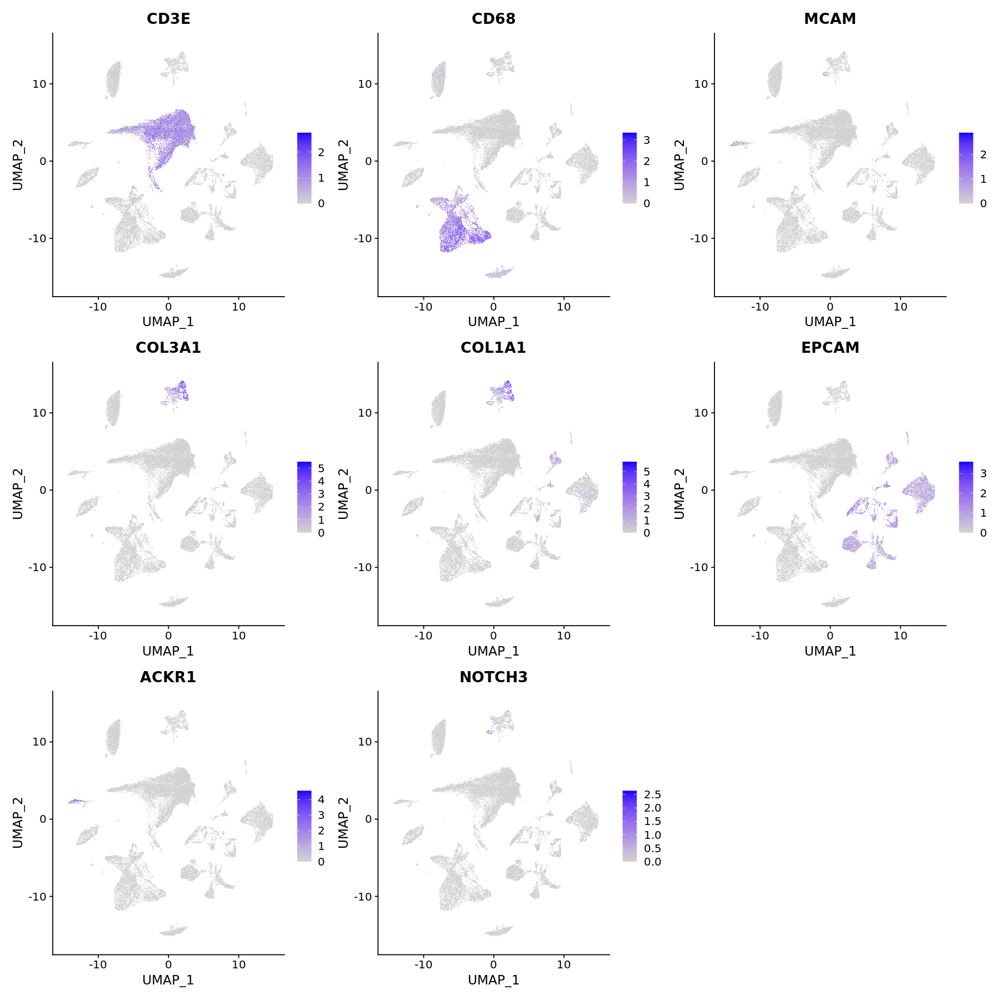

In [53]:
fig.size(15, 15)
FeaturePlot(obj, features = c('CD3E', 'CD68', 'MCAM', 'COL3A1', 'COL1A1', 'EPCAM', 'ACKR1', 'NOTCH3'), ncol = 3, reduction = 'umap', raster = TRUE)  


Warning message:
“Removed 6705 rows containing missing values (`geom_point()`).”


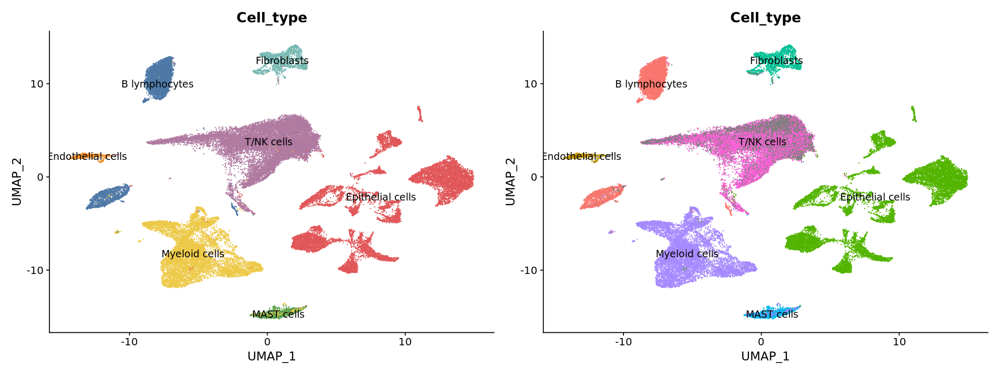

In [54]:
fig.size(6, 16)
DimPlot(obj, group.by = 'Cell_type', label = TRUE) + guides(color = 'none') + scale_color_tableau()  | 
DimPlot(obj, group.by = 'Cell_type', label = TRUE) + guides(color = 'none')


In [57]:
i = which(
    between(obj@reductions$umap@cell.embeddings[, 'UMAP_1'], -2, 2) & 
    between(obj@reductions$umap@cell.embeddings[, 'UMAP_2'], 9, 15)
)


Warning message:
“Removed 68 rows containing missing values (`geom_point()`).”


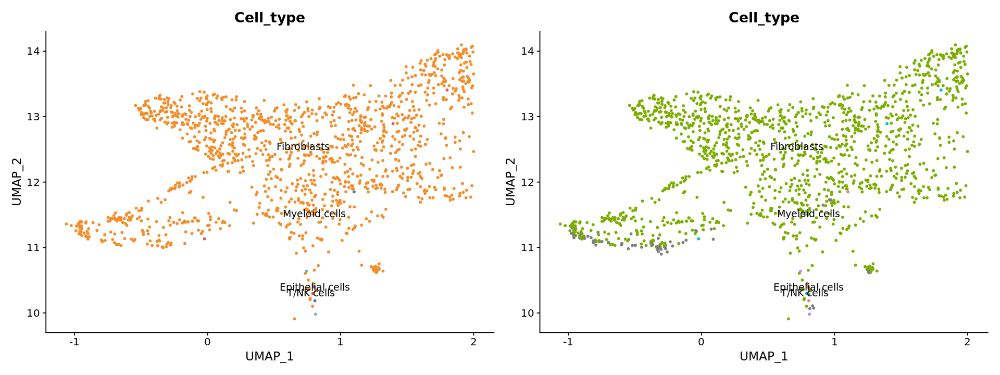

In [58]:
fig.size(6, 16)
DimPlot(obj[, i], group.by = 'Cell_type', label = TRUE) + guides(color = 'none') + scale_color_tableau()  | 
DimPlot(obj[, i], group.by = 'Cell_type', label = TRUE) + guides(color = 'none')


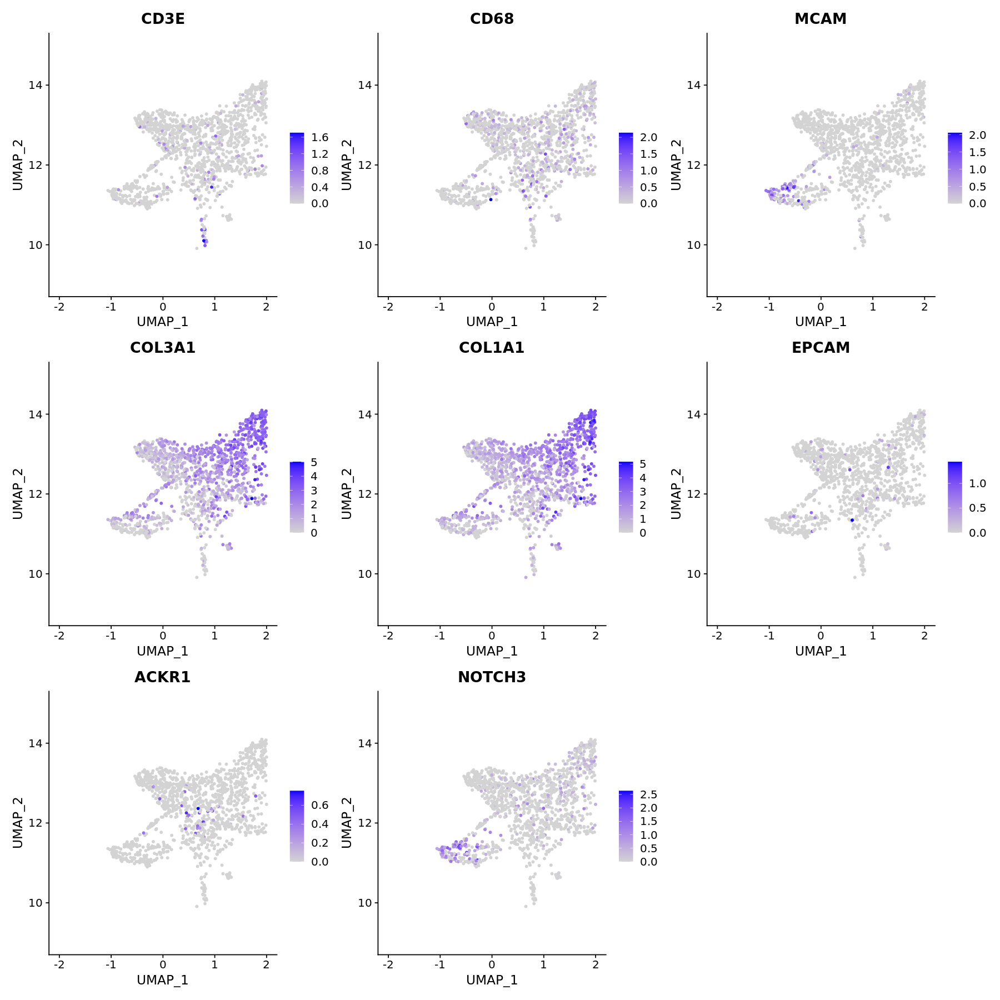

In [61]:
fig.size(15, 15)
FeaturePlot(obj[, i], features = c('CD3E', 'CD68', 'MCAM', 'COL3A1', 'COL1A1', 'EPCAM', 'ACKR1', 'NOTCH3'), ncol = 3, reduction = 'umap', raster = FALSE) 


# Subtype fibroblasts

## Isolate stromal cells

In [62]:
sort(unique(obj@meta.data$Cell_type))

[1] "B lymphocytes"     "Endothelial cells" "Epithelial cells" 
[4] "Fibroblasts"       "MAST cells"        "Myeloid cells"    
[7] "T/NK cells"

In [69]:
obj = subset(obj, Cell_type %in% c('Fibroblasts'))
# obj = subset(obj, Cell_type %in% c('Endothelial cells', 'Fibroblasts'))


In [70]:
obj = DietSeurat(obj, layers = c('counts')) 


Warning message:
“Resetting the data matrix to the raw counts”


## Remove debris

In [73]:
library(harmony)

In [ ]:
fig.size(5, 8)
.verbose = TRUE
obj = obj %>% 
        Seurat::NormalizeData(scale.factor = median(obj@meta.data$nCount_RNA)) %>% 
        Seurat::FindVariableFeatures() %>% 
        Seurat::ScaleData(verbose = .verbose) %>% 
        Seurat::RunPCA(npcs = 30, verbose = .verbose) %>% 
        RunHarmony(
            'Sample', plot_convergence = TRUE, 
            epsilon.cluster = -Inf, epsilon.harmony = -Inf, 
            max.iter.harmony = 10, max.iter.cluster = 30, 
            theta = 1
        ) 


In [79]:
system.time({
    U <- uwot::umap(obj@reductions$harmony@cell.embeddings, min_dist = 0.3, spread = 1.0, ret_extra = 'fgraph', fast_sgd = TRUE, n_sgd_threads = 40)     
})

colnames(U$embedding) <- c('HUMAP1', 'HUMAP2')
rownames(U$fgraph) <- colnames(U$fgraph) <- Cells(obj)

obj[['humap']] <- Seurat::CreateDimReducObject(
    embeddings = U$embedding,
    assay = 'RNA', 
    key = 'HUMAP_', 
    global = TRUE
)
new_graph <- Seurat::as.Graph(U$fgraph)
DefaultAssay(new_graph) <- DefaultAssay(obj)
obj[['humap_fgraph']] <- new_graph


   user  system elapsed 
  3.954   0.405   2.758 

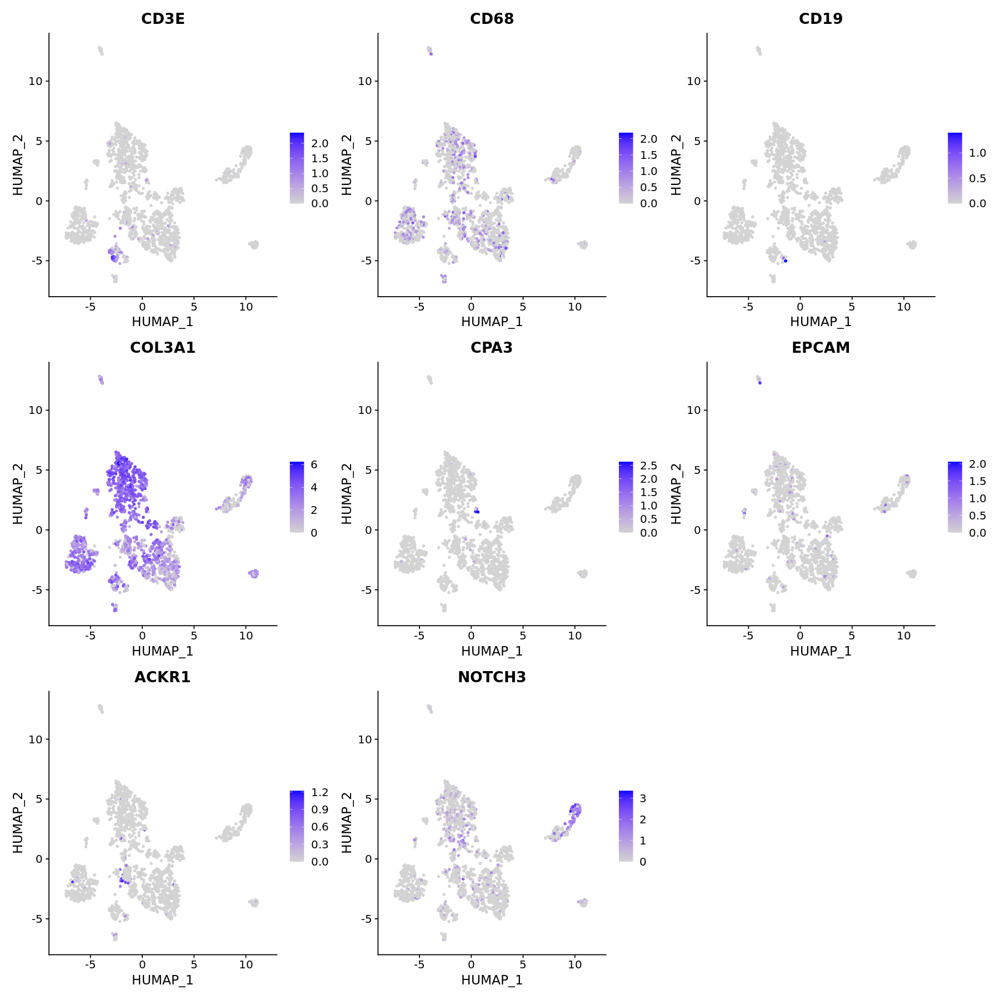

In [81]:
fig.size(15, 15)
FeaturePlot(obj, features = c('CD3E', 'CD68', 'CD19', 'COL3A1', 'CPA3', 'EPCAM', 'ACKR1', 'NOTCH3'), ncol = 3, reduction = 'humap', raster = FALSE)


In [82]:
## Define lots of different resolutions to try out 
resolutions_test <- seq(.01, 0.8, length.out = 5)

## Run FindClusters with multiple cores
system.time({
    suppressWarnings({
        obj <- Seurat::FindClusters(obj, graph.name = 'humap_fgraph', resolution = resolutions_test, verbose = FALSE)        
    })
})


   user  system elapsed 
  0.504  15.050  11.818 

In [83]:
obj@meta.data %>% 
    dplyr::select(matches('humap_fgraph_res')) %>% 
    map_int(nlevels)


humap_fgraph_res.0.01 humap_fgraph_res.0.2075  humap_fgraph_res.0.405 
                      1                       8                      10 
humap_fgraph_res.0.6025    humap_fgraph_res.0.8 
                     12                      16

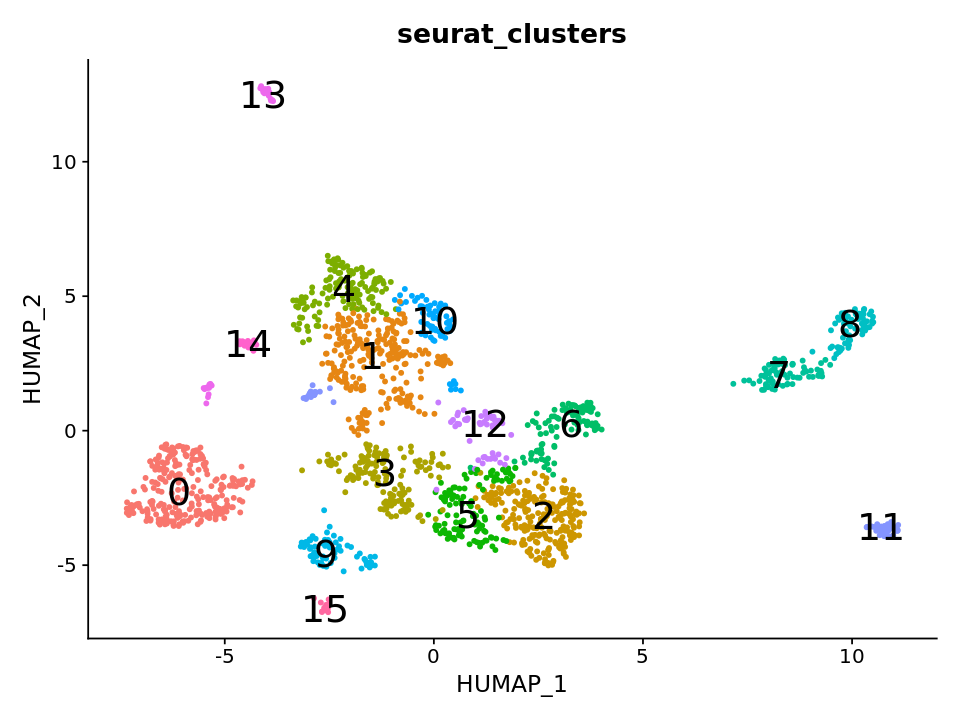

In [89]:
obj@meta.data$seurat_clusters <- obj@meta.data$humap_fgraph_res.0.8

fig.size(6, 8)
DimPlot(obj, reduction = 'humap', group.by = 'seurat_clusters', label = TRUE, pt.size = 1, label.size = 8) + 
    guides(color = 'none') + 
    # scale_color_tableau('Classic 20') + 
    NULL


In [101]:
library(presto)
markers = presto::wilcoxauc(obj, 'seurat_clusters')
markers = markers %>% dplyr::mutate(group = factor(group, 0:100)) 


In [102]:
top_markers(markers)

rank,0,1,2,3,4,5,6,7,8,10,11
<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,FBLN1,CTHRC1,SEPP1,TNFSF13B,CTHRC1,SOCS3,RPL21,TAGLN,HIGD1B,COL6A3,ACTA2
2,C7,COL3A1,TCF21,CTSS,COL1A1,A2M,RPL31,ADIRF,CALD1,COL6A1,ITGBL1
3,CCDC80,COL6A3,INMT,CCL19,COL1A2,JUNB,RPS6,MYH11,NOTCH3,MXRA5,LTBP1
4,IGFBP4,BGN,GPC3,RBP5,LGALS1,INMT,RPLP1,MYL9,MYL9,CTSB,LMCD1
5,C3,COL1A1,LIMCH1,CYP1B1,COL3A1,CCL2,RPL32,PTMA,NDUFA4L2,POSTN,PCSK1N
6,SFRP2,COL8A1,A2M,TMEM176B,COL5A2,IRF1,RPL41,HSPB1,TINAGL1,COL1A1,ROBO2
7,FTL,HOPX,MACF1,TYMP,COL12A1,EGR1,RPL34,ACTA2,TPPP3,COL3A1,TAGLN
8,EFEMP1,SPARC,MFAP4,C3,CTSK,NFKBIZ,RPL27A,DES,RGS5,SH3BGRL3,MYLK
9,GPNMB,LGALS1,ADH1B,VCAM1,SPARC,GPC3,RPL26,DSTN,PDGFRB,LY6E,MYH11


In [96]:
remove = c('15', '14', '13', '12', '9')
keep = setdiff(as.character(unique(markers$group)), remove)


In [97]:
obj = subset(obj, seurat_clusters %in% keep)

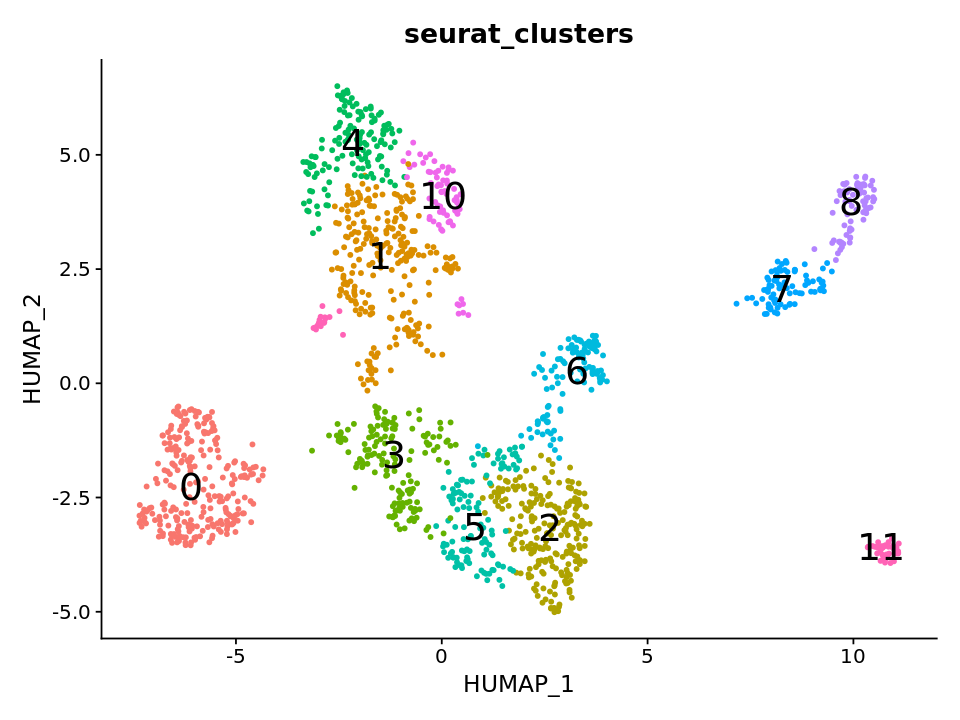

In [98]:
fig.size(6, 8)
DimPlot(obj, reduction = 'humap', group.by = 'seurat_clusters', label = TRUE, pt.size = 1, label.size = 8) + 
    guides(color = 'none') + 
    # scale_color_tableau('Classic 20') + 
    NULL


In [103]:
obj = DietSeurat(obj, layers = 'counts')

Warning message:
“Resetting the data matrix to the raw counts”


## Subtypes

In [104]:
library(harmony)

Warning message:
“Cannot find a parent environment called Seurat”
Warning message:
“The following arguments are not used: nselect”
Centering and scaling data matrix

PC_ 1 
Positive:  GPX3, A2M, SEPP1, ADH1B, GPC3, ADIRF, SOD3, TCF21, MGP, INMT 
	   FHL1, FMO2, G0S2, PPP1R14A, RPS26, LIMCH1, FGFR4, FIGF, AOC3, CFD 
	   NPNT, PLEKHH2, MAL, SCN7A, GPM6B, SLC40A1, ABCA8, TGM2, SHISA3, SPINT2 
Negative:  COL1A1, CTHRC1, COL3A1, COL1A2, COL5A2, THBS2, CTSK, SPARC, LGALS1, COL6A3 
	   THY1, POSTN, VCAN, SERPINH1, COL5A1, MXRA5, HTRA1, SFRP2, MMP11, PDPN 
	   COL12A1, SULF1, PKM, CERCAM, COL11A1, ISLR, CTSB, COL6A2, ADAM12, COL6A1 
PC_ 2 
Positive:  ACTA2, MYL9, TPM1, TAGLN, TPM2, CALD1, ACTG2, MYL6, MYH11, MYH9 
	   WFDC1, TINAGL1, CAV1, MCAM, TGFBI, CNN1, ASPN, HIGD1B, MMP11, NOTCH3 
	   COL12A1, CHN1, SDC2, PPP1R14A, CARMN, PTP4A3, COL10A1, FILIP1L, RGS5, CHCHD10 
Negative:  C3, C7, FBLN1, CCDC80, IGFBP4, DNAJB1, SERPINF1, NFKBIA, PTGDS, IGF1 
	   FTL, DCN, KLF4, SOD2, SFRP2, RSPO3, EFEMP1

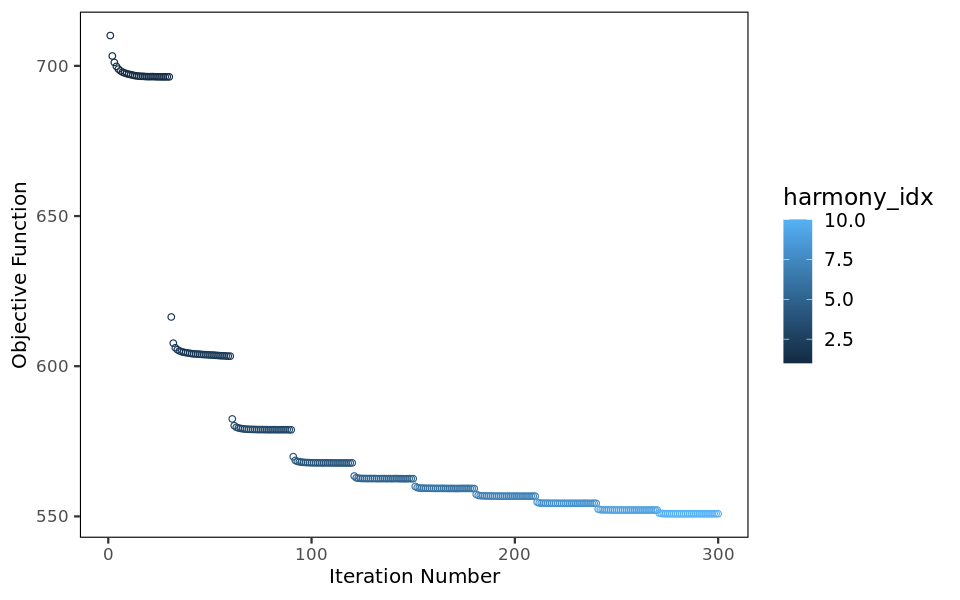

In [105]:
fig.size(5, 8)
.verbose = TRUE
obj = obj %>% 
        Seurat::NormalizeData(scale.factor = median(obj@meta.data$nCount_RNA)) %>% 
        Seurat::FindVariableFeatures() %>% 
        Seurat::ScaleData(verbose = .verbose) %>% 
        Seurat::RunPCA(npcs = 30, verbose = .verbose) %>% 
        RunHarmony(
            'Sample', plot_convergence = TRUE, 
            epsilon.cluster = -Inf, epsilon.harmony = -Inf, 
            max.iter.harmony = 10, max.iter.cluster = 30, 
            theta = 1
        ) 


In [106]:
system.time({
    U <- uwot::umap(obj@reductions$harmony@cell.embeddings, min_dist = 0.3, spread = 1.0, ret_extra = 'fgraph', fast_sgd = TRUE, n_sgd_threads = 40)     
})

colnames(U$embedding) <- c('HUMAP1', 'HUMAP2')
rownames(U$fgraph) <- colnames(U$fgraph) <- Cells(obj)

obj[['humap']] <- Seurat::CreateDimReducObject(
    embeddings = U$embedding,
    assay = 'RNA', 
    key = 'HUMAP_', 
    global = TRUE
)
new_graph <- Seurat::as.Graph(U$fgraph)
DefaultAssay(new_graph) <- DefaultAssay(obj)
obj[['humap_fgraph']] <- new_graph


   user  system elapsed 
  3.667   0.368   2.784 

In [108]:
## Define lots of different resolutions to try out 
resolutions_test <- seq(.01, 0.8, length.out = 5)

## Run FindClusters with multiple cores
system.time({
    suppressWarnings({
        obj <- Seurat::FindClusters(obj, graph.name = 'humap_fgraph', resolution = resolutions_test, verbose = FALSE)        
    })
})


   user  system elapsed 
  0.434  14.578  14.166 

In [109]:
obj@meta.data %>% 
    dplyr::select(matches('humap_fgraph_res')) %>% 
    map_int(nlevels)


humap_fgraph_res.0.01 humap_fgraph_res.0.2075  humap_fgraph_res.0.405 
                      1                       6                       8 
humap_fgraph_res.0.6025    humap_fgraph_res.0.8 
                     10                      13

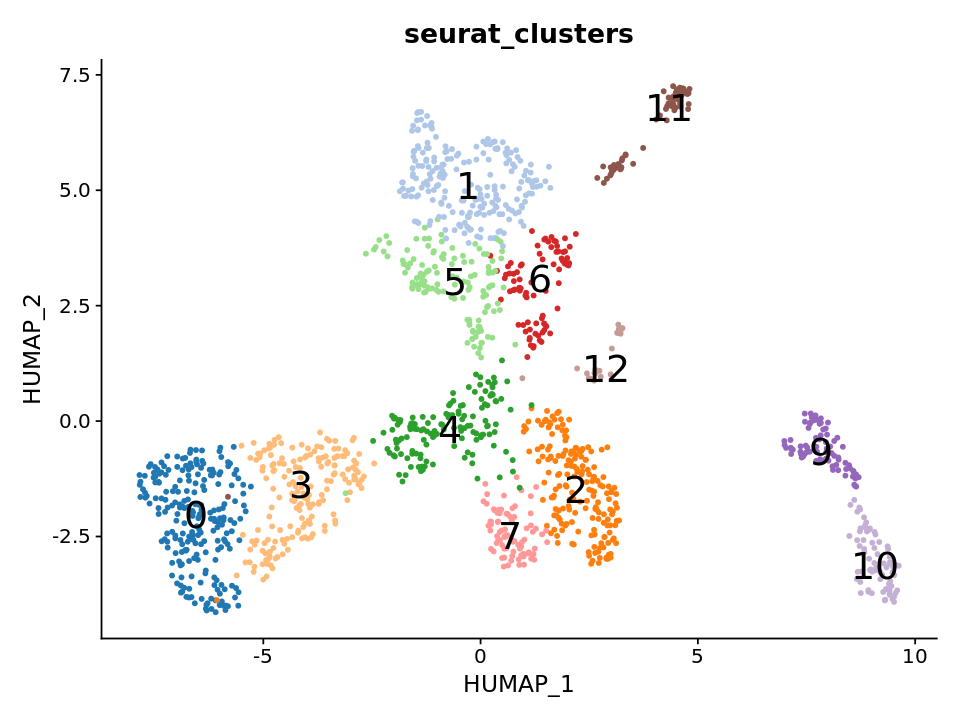

In [125]:
obj@meta.data$seurat_clusters <- obj@meta.data$humap_fgraph_res.0.8

fig.size(6, 8)
DimPlot(obj, reduction = 'humap', group.by = 'seurat_clusters', label = TRUE, pt.size = 1, label.size = 8) + 
    guides(color = 'none') + 
    scale_color_tableau('Classic 20') + 
    NULL


In [117]:
library(presto)
markers = presto::wilcoxauc(obj, 'seurat_clusters')
markers = markers %>% dplyr::mutate(group = factor(group, 0:100)) 


In [118]:
top_markers(markers)

rank,0,1,2,3,4,5,6,7,9,10,11,12
<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,SEPP1,CTHRC1,C7,A2M,CYP1B1,COL3A1,BGN,IGFBP4,TAGLN,HIGD1B,ITGBL1,EIF1
2,TCF21,LGALS1,FBLN1,TGM2,CCL19,COL1A1,HTRA3,SFRP2,ADIRF,CALD1,LMCD1,GAPDH
3,MFAP4,COL1A1,CCDC80,LITAF,C3,COL6A3,TIMP1,NR4A1,MYH11,NOTCH3,PCSK1N,RPS3
4,A2M,COL1A2,C3,PTGDS,TIMP1,COL1A2,ASPN,IGF1,MYL9,MYL9,LTBP1,RPS19
5,GPC3,COL3A1,EFEMP1,NAP1L1,RBP5,CTHRC1,COL10A1,CEBPB,PTMA,NDUFA4L2,ROBO2,RPS13
6,MACF1,COL5A2,GSN,CFD,CD74,COL5A2,COL8A1,FBLN1,ACTA2,TINAGL1,ACTA2,GNB2L1
7,INMT,SPARC,FTL,INMT,CTSS,MXRA5,SPARC,FTL,DSTN,TPPP3,MYLK,RPL8
8,LIMCH1,THBS2,DCN,CCL2,VCAM1,SPARC,COL3A1,IER3,DES,IGFBP7,MYH11,RPS16
9,ADH1B,COL5A1,SERPINF1,ADH1B,TNFSF13B,SFRP2,COL6A3,MGST1,HSPB1,COX4I2,TAGLN,SERTAD1


In [114]:
obj = subset(obj, seurat_clusters %in% setdiff(as.character(unique(obj@meta.data$seurat_clusters)), '8'))

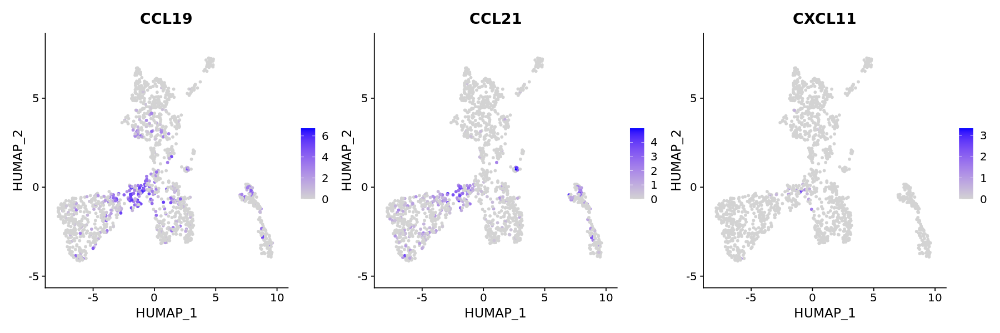

In [124]:
fig.size(5, 15)
FeaturePlot(obj, features = c('CCL19', 'CCL21', 'CXCL11'), ncol = 3, reduction = 'humap', raster = FALSE)


## Get DEGs

In [127]:
meta_data = obj@meta.data
meta_data$cluster = meta_data$seurat_clusters
meta_data$library = meta_data$Sample
counts = counts[, rownames(meta_data)]

In [133]:
library(singlecellmethods)
library(presto)
library(lme4)
library(future)
library(furrr)
plan(multicore)

In [159]:
genes_merfish = unique(fread('share/cells/markers_lvl1.csv')$feature)

In [160]:
genes_merfish = intersect(genes_merfish, rownames(obj))

In [161]:
pb <- presto::collapse_counts(
    counts, meta_data, 
    c('library', 'cluster'), 
    min_cells_per_group = 10, 
    get_norm = TRUE
)  

system.time({
    suppressWarnings({
        presto_res <- presto.presto(
            y ~ 1 + (1|cluster) + (1|cluster:library) + (1|library) + offset(logUMI), 
            pb$meta_data, 
            pb$counts_mat,
            features = genes_merfish, ## only care about these 
            size_varname = 'logUMI', 
            effects_cov = c('cluster'),
            ncore = 5, 
            min_sigma = .05, 
            family = 'poisson',
            nsim = 1000
        ) 
    })
})

contrasts_mat <- make_contrast.presto(presto_res, 'cluster')
effects_marginal <- contrasts.presto(presto_res, contrasts_mat, one_tailed = TRUE) %>% 
    dplyr::mutate(cluster = contrast) %>% 
    dplyr::mutate(
        ## convert stats to log2 for interpretability 
        logFC = sign(beta) * log2(exp(abs(beta))),
        SD = log2(exp(sigma)),
        zscore = logFC / SD
    ) %>% 
    dplyr::select(cluster, feature, logFC, SD, zscore, pvalue) %>% 
    arrange(pvalue)
effects_marginal$fdr <- p.adjust(effects_marginal$pvalue, method = 'BH')


CAREFUL: get_norm makes very strong assumptions about data

CAUTION: if using GLMM, make sure your counts are integers!

Joining with `by = join_by(grpvar_orig)`


   user  system elapsed 
809.066  23.391 103.150 

In [145]:
# presto::toptable.presto(effects_marginal)

In [168]:
# effects_marginal %>% filter(feature == 'TIMP1')

In [170]:
effects_marginal %>% 
    filter(cluster == '4') %>% 
    head(10)


cluster,feature,logFC,SD,zscore,pvalue,fdr
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
4,CCL19,5.0675013,1.46239241,3.465213,0.0002649058,0.5281381
4,TIMP1,1.4264541,0.49329774,2.891670,0.0019160030,0.5637761
4,CD74,1.1338200,0.42184789,2.687746,0.0035968043,0.5920597
4,GBP4,1.4237801,0.53812949,2.645795,0.0040749649,0.6248836
4,VCAM1,2.4110578,0.92583043,2.604211,0.0046043021,0.6248836
4,VIM,0.1377127,0.05506553,2.500887,0.0061941401,0.7040436
4,RARRES3,0.8161483,0.33668049,2.424103,0.0076731217,0.7367795
4,CCL5,1.2243105,0.51915705,2.358266,0.0091802628,0.7902345
4,ACKR1,3.8756439,1.66699428,2.324929,0.0100378700,0.7953135


In [163]:
effects_marginal %>% 
    split(.$cluster) %>% 
    map(dplyr::arrange, -zscore) %>% 
    # map(head, 5)
    map(filter, pvalue < .05)


cluster,feature,logFC,SD,zscore,pvalue,fdr
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0,SEPP1,2.0861928,0.7243685,2.880016,0.001988274,0.5637761
0,SLC40A1,1.4772694,0.5391651,2.739921,0.003072702,0.5763075
0,G0S2,2.5260677,0.9271309,2.724607,0.003218900,0.5763075
0,CD14,2.0321980,0.7821109,2.598350,0.004683647,0.6248836
0,DUSP6,1.5939781,0.7493711,2.127088,0.016706399,0.8174674
0,ETV1,1.5024131,0.7166909,2.096319,0.018026930,0.8174674
0,BMP5,2.5836783,1.3501599,1.913609,0.027835063,0.8174674
0,WNT2,3.3116995,1.7762849,1.864397,0.031133015,0.8174674
0,STMN1,0.7116932,0.3836307,1.855152,0.031787270,0.8174674


## Cache

In [174]:
obj %>% DietSeurat(layers = 'counts') %>% saveRDS('data/stromal_ref_lee_lung.rds')

Warning message:
“Resetting the data matrix to the raw counts”


In [171]:
fwrite(effects_marginal, 'data/stromal_ref_lee_lung_markers.csv')

# Myeloid

## Data

In [8]:
obj_all = readRDS('data/all_ref_lee_lung.rds')
genes_merfish = unique(fread('share/cells/markers_lvl1.csv')$feature)
genes_merfish = intersect(rownames(obj_all), genes_merfish)

In [21]:
length(genes_merfish)
obj_all


[1] 433

An object of class Seurat 
14031 features across 57222 samples within 1 assay 
Active assay: RNA (14031 features, 0 variable features)
 2 layers present: counts, data

In [25]:
table(obj_all@meta.data$Cell_type)


    B lymphocytes Endothelial cells  Epithelial cells       Fibroblasts 
             5781               645             13852              1739 
       MAST cells     Myeloid cells        T/NK cells 
             1809             10123             16568 

## Remove outliers

In [23]:
library(harmony)

In [61]:
fig.size(5, 8)
.verbose = TRUE
obj = subset(obj_all[genes_merfish, ], Cell_type %in% 'Myeloid cells') 


Warning message:
“Removing 6705 cells missing data for vars requested”


Warning message:
“The following arguments are not used: nselect”
Centering and scaling data matrix

PC_ 1 
Positive:  C1QA, C1QB, APOE, GPNMB, C1QC, CCL18, MSR1, MS4A4A, CD163, MARCO 
	   FCGR3A, MRC1, PLTP, FOLR2, FN1, SLC40A1, SEPP1, PLA2G7, ACE, CCL13 
	   CXCL16, JUN, HSPA1A, CCR1, SERPINA1, ITLN1, TYROBP, PROS1, IL2RA, PECAM1 
Negative:  GPR183, G0S2, BIRC3, DUSP4, CST7, CXCR4, IL1B, JUNB, CCR7, CD1E 
	   ID2, CD1C, BHLHE40, FCN1, FCER1A, LAMP3, CD2, CCL17, FSCN1, CSF2RA 
	   S100B, PTGS2, TNFRSF1B, VEGFA, LST1, NLRP3, CXCL8, TRAC, CD3E, EREG 
PC_ 2 
Positive:  S100A9, IL1B, SOD2, S100A8, FCN1, S100A12, CXCL8, VCAN, CXCL2, EREG 
	   G0S2, TIMP1, CCL3, IL1RN, CCL20, LYZ, NLRP3, PTGS2, CD14, CCL4 
	   CXCL3, OSM, PHLDA1, CSF3R, AIF1, IL1A, VEGFA, CD36, IL6, DUSP6 
Negative:  CD74, HLA-DRA, HLA-DRB1, CST7, IL2RG, IL32, DUSP4, CD1E, LAMP3, CCR7 
	   C1QB, TRAC, CD3D, C1QA, FSCN1, CD2, C1QC, IL7R, CD3E, S100B 
	   CSF2RA, CCL17, STMN1, CXCR4, AXL, CD1C, ALOX5AP, HLA-C, CXCR3, CCL22 
PC

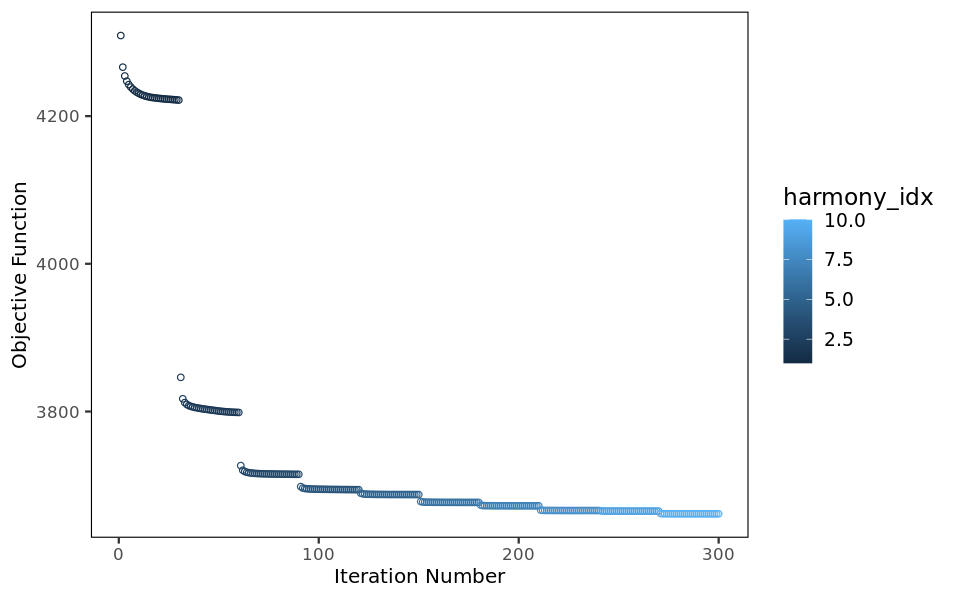

In [66]:
obj = obj %>% 
        Seurat::NormalizeData(scale.factor = median(obj@meta.data$nCount_RNA)) %>% 
        Seurat::FindVariableFeatures() %>% 
        Seurat::ScaleData(verbose = .verbose) %>% 
        Seurat::RunPCA(npcs = 30, verbose = .verbose) %>% 
        RunHarmony(
            'Sample', plot_convergence = TRUE, 
            epsilon.cluster = -Inf, epsilon.harmony = -Inf, 
            max.iter.harmony = 10, max.iter.cluster = 30, 
            theta = 1
        ) 

In [67]:
system.time({
    U <- uwot::umap(obj@reductions$harmony@cell.embeddings, min_dist = 0.3, spread = 1.0, ret_extra = 'fgraph', fast_sgd = TRUE, n_sgd_threads = 40)     
})

colnames(U$embedding) <- c('HUMAP1', 'HUMAP2')
rownames(U$fgraph) <- colnames(U$fgraph) <- Cells(obj)

obj[['humap']] <- Seurat::CreateDimReducObject(
    embeddings = U$embedding,
    assay = 'RNA', 
    key = 'HUMAP_', 
    global = TRUE
)
new_graph <- Seurat::as.Graph(U$fgraph)
DefaultAssay(new_graph) <- DefaultAssay(obj)
obj[['humap_fgraph']] <- new_graph


   user  system elapsed 
 10.534   0.198   3.822 

In [68]:
## Define lots of different resolutions to try out 
resolutions_test <- seq(.01, 0.8, length.out = 10)

## Run FindClusters with multiple cores
system.time({
    suppressWarnings({
        obj <- Seurat::FindClusters(obj, graph.name = 'humap_fgraph', resolution = resolutions_test, verbose = FALSE)        
    })
})


   user  system elapsed 
  6.757   0.002   6.761 

In [69]:
obj@meta.data %>% 
    dplyr::select(matches('humap_fgraph_res')) %>% 
    map_int(nlevels)


humap_fgraph_res.0.01 humap_fgraph_res.0.0977777777777778 
                                  2                                   6 
 humap_fgraph_res.0.185555555555556  humap_fgraph_res.0.273333333333333 
                                  9                                  11 
 humap_fgraph_res.0.361111111111111  humap_fgraph_res.0.448888888888889 
                                 13                                  13 
 humap_fgraph_res.0.536666666666667  humap_fgraph_res.0.624444444444445 
                                 15                                  17 
 humap_fgraph_res.0.712222222222222                humap_fgraph_res.0.8 
                                 17                                  16

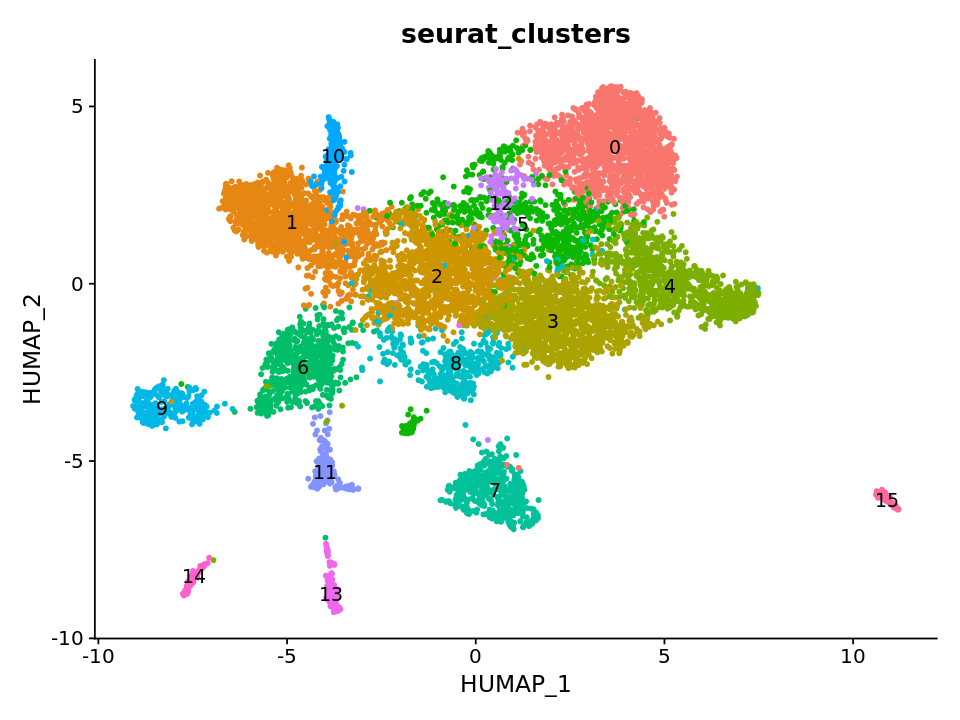

In [70]:
obj@meta.data$seurat_clusters <- obj@meta.data$humap_fgraph_res.0.8

fig.size(6, 8)
DimPlot(obj, reduction = 'humap', group.by = 'seurat_clusters', label = TRUE, pt.size = 1) + 
    guides(color = 'none') + 
    # scale_color_tableau('Classic 20') + 
    NULL


In [72]:
library(presto)
markers = presto::wilcoxauc(obj, 'seurat_clusters')

In [73]:
markers %>% 
    filter(feature %in% c('CD3E', 'CD68', 'CD19', 'COL3A1', 'CPA3', 'EPCAM', 'ACKR1', 'NOTCH3')) %>% 
    filter(auc > .55) %>% 
    arrange(-auc)


markers %>% 
    dplyr::mutate(group = factor(group, 0:19)) %>% 
    top_markers() %>% t()

feature,group,avgExpr,logFC,statistic,auc,pval,padj,pct_in,pct_out
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
CPA3,15,3.6922742,3.6809408,1061165,0.9810886,0,0,96.29630,1.807289
CD3E,7,0.7719905,0.7534151,3786606,0.8501239,0,0,71.80043,2.763403


rank,1,2,3,4,5,6,7,8,9,10
0,MARCO,SERPINA1,C1QA,C1QB,FN1,CXCL16,MRC1,LY6E,INHBA,ALOX5
1,FCN1,S100A8,IL1B,SOD2,S100A9,LYZ,CXCL8,G0S2,VCAN,EREG
2,CCL3,CCL4,CXCL8,GPR183,IL1B,CXCL2,EGR1,CXCL3,SOD2,SPP1
3,SEPP1,SLC40A1,FOLR2,PLTP,APOE,GPNMB,C1QA,C1QC,CD163,CCL13
4,APOE,TYROBP,C1QB,AIF1,C1QC,C1QA,SPP1,CCL18,HLA-DRA,S100A9
5,GPNMB,PLA2G7,VIM,APOE,HSPA5,MANF,MARCO,CCR1,MS4A4A,CD163
6,CD74,CD1C,HLA-DRA,FCER1A,GPR183,CD1E,HLA-DRB1,LST1,CST7,S100B
7,IL32,CD3D,TRAC,CD2,CD3E,CXCR4,CCL5,CD69,CD7,CD3G
8,CXCL10,GBP1,STAT1,GBP4,TNFSF13B,TAP1,CXCL9,PSMB9,RARRES3,CCL4
9,STMN1,HMGB2,PTTG1,UBE2C,MKI67,TOP2A,RANBP1,UBE2S,PCNA,ALOX5AP


Filter on poor QC clusters. 

In [77]:
clusters_keep = setdiff(unique(obj@meta.data$seurat_clusters), c('15', '7', '9'))

obj = subset(obj, seurat_clusters %in% clusters_keep)

Same, after filtering. 

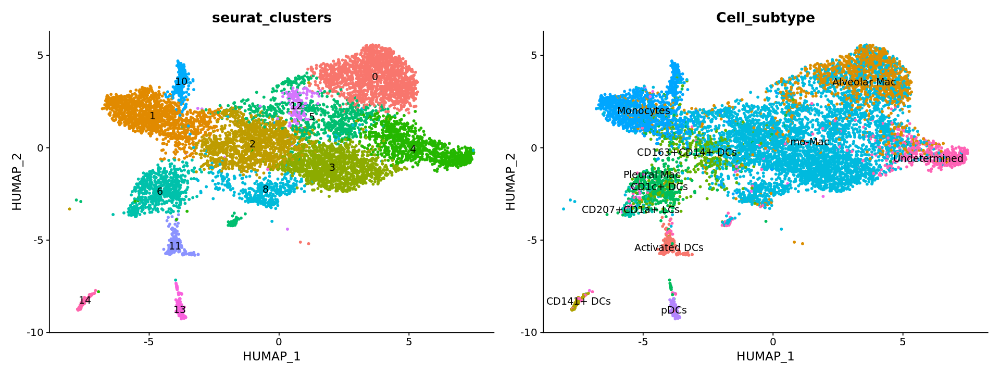

In [78]:
# obj@meta.data$seurat_clusters <- obj@meta.data$humap_fgraph_res.0.8

fig.size(6, 16)
DimPlot(obj, reduction = 'humap', group.by = 'seurat_clusters', label = TRUE, pt.size = 1) + 
    guides(color = 'none') + 
    # scale_color_tableau('Classic 20') +  
    NULL | 
DimPlot(obj, reduction = 'humap', group.by = 'Cell_subtype', label = TRUE, pt.size = 1) + 
    guides(color = 'none') + 
    # scale_color_tableau('Classic 20') + 
    NULL


In [79]:
library(presto)
markers = presto::wilcoxauc(obj, 'seurat_clusters')
markers %>% 
    dplyr::mutate(group = factor(group, 0:19)) %>% 
    top_markers() %>% t()

rank,1,2,3,4,5,6,7,8,9,10
0,MARCO,SERPINA1,C1QA,C1QB,FN1,ALOX5AP,CXCL16,LY6E,ALOX5,INHBA
1,FCN1,IL1B,S100A8,SOD2,S100A9,LYZ,CXCL8,G0S2,VCAN,EREG
2,CCL3,CCL4,CXCL8,GPR183,IL1B,EGR1,CXCL2,CXCL3,FOSB,SPP1
3,SEPP1,SLC40A1,FOLR2,PLTP,APOE,GPNMB,C1QA,C1QC,CCL13,CD163
4,APOE,AIF1,TYROBP,C1QB,C1QC,C1QA,SPP1,CCL18,VIM,HLA-DRA
5,GPNMB,PLA2G7,VIM,APOE,HSPA5,MANF,CCR1,MARCO,MS4A4A,CD163
6,CD74,CD1C,HLA-DRA,FCER1A,GPR183,CD1E,HLA-DRB1,CST7,LST1,S100B
8,CXCL10,GBP1,STAT1,GBP4,TAP1,TNFSF13B,CXCL9,RARRES3,PSMB9,CCL4
10,LST1,FCN1,AIF1,TIMP1,JUNB,HLA-E,PSMB9,WARS,FCGR3A,SERPINA1
11,LAMP3,BIRC3,FSCN1,CCR7,ID2,CSF2RA,CXCR4,IL7R,DUSP4,CST7


## Markers

In [84]:
meta_data = obj@meta.data
meta_data$cluster = meta_data$seurat_clusters
meta_data$library = meta_data$Sample
counts = obj_all@assays$RNA@counts[, rownames(meta_data)]
# counts = counts[, rownames(meta_data)]


In [85]:
library(singlecellmethods)
library(presto)
library(lme4)
library(future)
library(furrr)
plan(multicore)

In [87]:
pb <- presto::collapse_counts(
    counts, meta_data, 
    c('library', 'cluster'), 
    min_cells_per_group = 10, 
    get_norm = TRUE
)  

system.time({
    suppressWarnings({
        presto_res <- presto.presto(
            y ~ 1 + (1|cluster) + (1|cluster:library) + (1|library) + offset(logUMI), 
            pb$meta_data, 
            pb$counts_mat,
            features = rownames(obj), 
            size_varname = 'logUMI', 
            effects_cov = c('cluster'),
            ncore = 10, 
            min_sigma = .05, 
            family = 'poisson',
            nsim = 1000
        ) 
    })
})

contrasts_mat <- make_contrast.presto(presto_res, 'cluster')
effects_marginal <- contrasts.presto(presto_res, contrasts_mat, one_tailed = TRUE) %>% 
    dplyr::mutate(cluster = contrast) %>% 
    dplyr::mutate(
        ## convert stats to log2 for interpretability 
        logFC = sign(beta) * log2(exp(abs(beta))),
        SD = log2(exp(sigma)),
        zscore = logFC / SD
    ) %>% 
    dplyr::select(cluster, feature, logFC, SD, zscore, pvalue) %>% 
    arrange(pvalue)
effects_marginal$fdr <- p.adjust(effects_marginal$pvalue, method = 'BH')


CAREFUL: get_norm makes very strong assumptions about data

CAUTION: if using GLMM, make sure your counts are integers!

Joining with `by = join_by(grpvar_orig)`


   user  system elapsed 
522.304  11.376  63.759 

In [88]:
# effects_marginal %>% 
#     filter(cluster == '4') %>% 
#     head(10)


In [89]:
effects_marginal %>% 
    split(.$cluster) %>% 
    map(dplyr::arrange, -zscore) %>% 
    map(filter, pvalue < .05) %>% 
    map(head, 5) %>% 
    identity()


cluster,feature,logFC,SD,zscore,pvalue,fdr
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0,CCL18,4.236805,0.8434911,5.022939,2.544332e-07,6.805174e-06
0,CXCL16,1.159251,0.2345031,4.943433,3.837931e-07,9.796363e-06
0,LY6E,1.378260,0.2839261,4.854289,6.040974e-07,1.498665e-05
0,FN1,3.517204,0.7895758,4.454548,4.203499e-06,8.187303e-05
0,MARCO,3.984152,0.9002844,4.425437,4.812357e-06,9.181255e-05
cluster,feature,logFC,SD,zscore,pvalue,fdr
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,S100A12,7.659360,1.4076437,5.441263,2.645200e-08,8.801588e-07
1,VCAN,3.949256,0.8566067,4.610350,2.009962e-06,4.304861e-05


## Cache

In [92]:
fwrite(effects_marginal, 'data/myeloid_ref_lee_lung_markers.csv')
obj@meta.data %>% 
    tibble::rownames_to_column('cellid') %>% 
    fwrite('data/myeloid_ref_lee_lung_meta.csv')


# T/NK

## Data

In [8]:
obj_all = readRDS('data/all_ref_lee_lung.rds')
genes_merfish = unique(fread('share/cells/markers_lvl1.csv')$feature)
genes_merfish = intersect(rownames(obj_all), genes_merfish)


In [93]:
table(obj_all@meta.data$Cell_type)


    B lymphocytes Endothelial cells  Epithelial cells       Fibroblasts 
             5781               645             13852              1739 
       MAST cells     Myeloid cells        T/NK cells 
             1809             10123             16568 

## Remove outliers

In [23]:
library(harmony)

In [94]:
fig.size(5, 8)
.verbose = TRUE
obj = subset(obj_all[genes_merfish, ], Cell_type %in% 'T/NK cells') 


Warning message:
“Removing 6705 cells missing data for vars requested”


Warning message:
“Cannot find a parent environment called Seurat”
Warning message:
“The following arguments are not used: nselect”
Centering and scaling data matrix

PC_ 1 
Positive:  CCL5, GNLY, FGFBP2, PRF1, CST7, CCL4, GZMA, FCGR3A, KLRF1, TYROBP 
	   S1PR5, TRDC, CCL3, CMC1, CX3CR1, TRGC1, CD8A, IFNG, ASCL2, CD8B 
	   ID2, TBX21, FASLG, ZNF683, GZMK, KLRG1, HAVCR2, EOMES, CD38, LAG3 
Negative:  TRAC, IL7R, JUNB, CD3D, CD3E, VIM, GPR183, CD2, IL32, BIRC3 
	   CCR7, TNFRSF4, ARHGDIB, FOS, CD27, TNFRSF25, CD4, CCR6, SELL, LEF1 
	   JUN, DNAJB1, BATF, IL2RA, TCF7, CD40LG, CXCR4, FOXP3, FLT3LG, TIMP1 
PC_ 2 
Positive:  FOS, IL7R, JUN, ANXA1, CD69, DNAJB1, JUNB, KLF2, FOSB, TCF7 
	   IER2, GPR183, HSPA1B, CCR7, CD40LG, XBP1, KLRB1, LEF1, FLT3LG, CXCR4 
	   FGFBP2, KLRF1, TYROBP, S1PR1, HSPA1A, TNF, SELL, FCGR3A, VIM, S1PR5 
Negative:  DUSP4, HLA-DRB1, CD74, CTLA4, TIGIT, BATF, HLA-DRA, CXCR6, IL2RA, TNFRSF9 
	   PTTG1, TNFRSF4, CXCL13, FOXP3, RBPJ, IL32, ZBED2, ENTPD1, TNFRSF1B, CD27 
	 

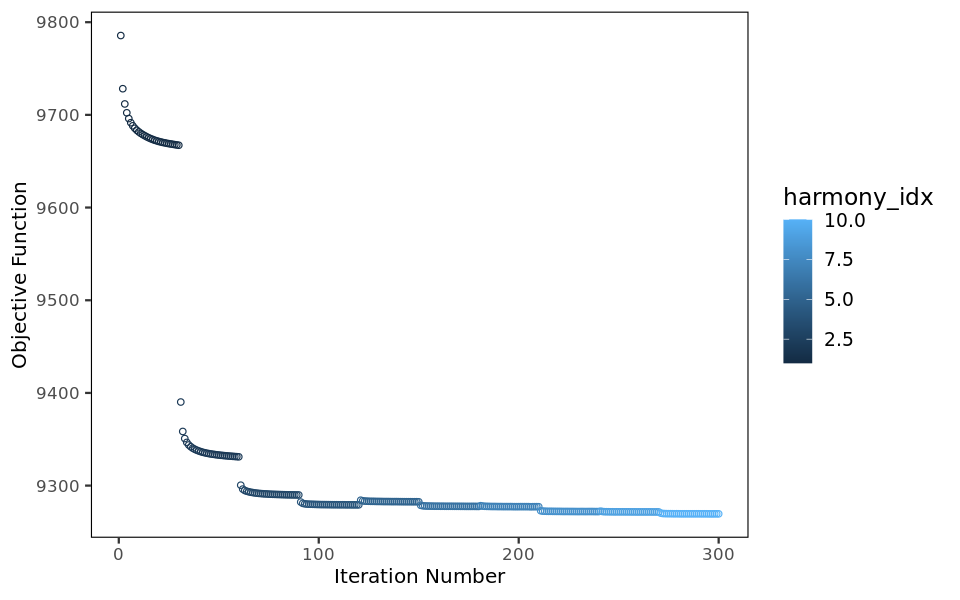

In [95]:
obj = obj %>% 
        Seurat::NormalizeData(scale.factor = median(obj@meta.data$nCount_RNA)) %>% 
        Seurat::FindVariableFeatures() %>% 
        Seurat::ScaleData(verbose = .verbose) %>% 
        Seurat::RunPCA(npcs = 30, verbose = .verbose) %>% 
        RunHarmony(
            'Sample', plot_convergence = TRUE, 
            epsilon.cluster = -Inf, epsilon.harmony = -Inf, 
            max.iter.harmony = 10, max.iter.cluster = 30, 
            theta = 1
        ) 

In [96]:
system.time({
    U <- uwot::umap(obj@reductions$harmony@cell.embeddings, min_dist = 0.3, spread = 1.0, ret_extra = 'fgraph', fast_sgd = TRUE, n_sgd_threads = 40)     
})

colnames(U$embedding) <- c('HUMAP1', 'HUMAP2')
rownames(U$fgraph) <- colnames(U$fgraph) <- Cells(obj)

obj[['humap']] <- Seurat::CreateDimReducObject(
    embeddings = U$embedding,
    assay = 'RNA', 
    key = 'HUMAP_', 
    global = TRUE
)
new_graph <- Seurat::as.Graph(U$fgraph)
DefaultAssay(new_graph) <- DefaultAssay(obj)
obj[['humap_fgraph']] <- new_graph


   user  system elapsed 
 14.807   0.271   5.000 

In [97]:
## Define lots of different resolutions to try out 
resolutions_test <- seq(.01, 0.8, length.out = 10)

## Run FindClusters with multiple cores
system.time({
    suppressWarnings({
        obj <- Seurat::FindClusters(obj, graph.name = 'humap_fgraph', resolution = resolutions_test, verbose = FALSE)        
    })
})


   user  system elapsed 
 16.768   2.115   2.788 

In [98]:
obj@meta.data %>% 
    dplyr::select(matches('humap_fgraph_res')) %>% 
    map_int(nlevels)


humap_fgraph_res.0.01 humap_fgraph_res.0.0977777777777778 
                                  1                                   3 
 humap_fgraph_res.0.185555555555556  humap_fgraph_res.0.273333333333333 
                                  4                                   5 
 humap_fgraph_res.0.361111111111111  humap_fgraph_res.0.448888888888889 
                                  6                                   6 
 humap_fgraph_res.0.536666666666667  humap_fgraph_res.0.624444444444445 
                                  7                                   9 
 humap_fgraph_res.0.712222222222222                humap_fgraph_res.0.8 
                                 10                                  12

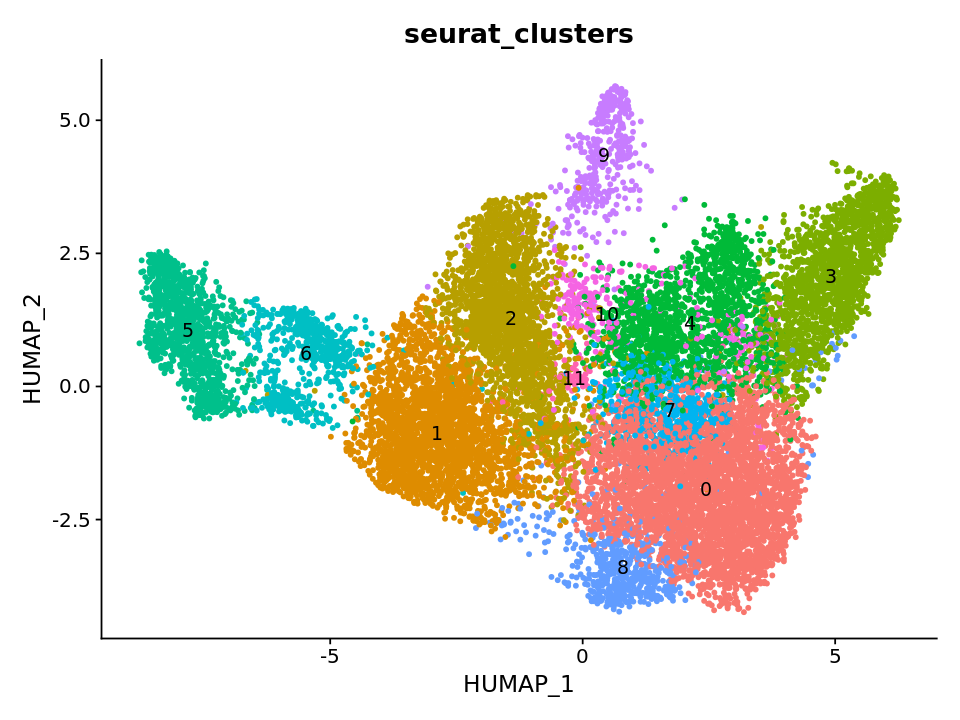

In [99]:
obj@meta.data$seurat_clusters <- obj@meta.data$humap_fgraph_res.0.8

fig.size(6, 8)
DimPlot(obj, reduction = 'humap', group.by = 'seurat_clusters', label = TRUE, pt.size = 1) + 
    guides(color = 'none') + 
    # scale_color_tableau('Classic 20') + 
    NULL


In [100]:
library(presto)
markers = presto::wilcoxauc(obj, 'seurat_clusters')

In [101]:
markers %>% 
    filter(feature %in% c('CD3E', 'CD68', 'CD19', 'COL3A1', 'CPA3', 'EPCAM', 'ACKR1', 'NOTCH3')) %>% 
    filter(auc > .55) %>% 
    arrange(-auc)


markers %>% 
    dplyr::mutate(group = factor(group, 0:19)) %>% 
    top_markers() %>% t()

feature,group,avgExpr,logFC,statistic,auc,pval,padj,pct_in,pct_out
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
CD3E,0,1.0326057,0.2198967,31579520,0.6158561,3.315175e-111,4.101345e-110,88.80796,77.99823
CD3E,7,0.9910138,0.1284827,5665619,0.5685875,4.984703e-09,3.996993e-08,86.56000,80.45537


rank,1,2,3,4,5,6,7,8,9,10
0,IL7R,FOS,JUNB,GPR183,JUN,ANXA1,CCR7,VIM,CD69,TCF7
1,GZMK,GZMA,CCL5,CST7,CCL4,CD74,CD8A,HLA-DRB1,CMC1,CD8B
2,CCL5,CD8A,CD8B,ZNF683,GZMA,CD7,CCL4,ID2,LAG3,ALOX5AP
3,IL32,TIGIT,BATF,TNFRSF4,TRAC,CD27,IL2RA,FOXP3,CD74,CTLA4
4,DUSP4,ALOX5AP,RBPJ,CD2,KLRB1,CXCL13,TRAC,CD3D,ARHGDIB,CXCR6
5,TYROBP,GNLY,PRF1,FGFBP2,FCGR3A,CST7,KLRF1,TRDC,CCL4,CMC1
6,FGFBP2,GNLY,CST7,PRF1,CCL5,CCL4,TRGC1,KLRG1,GZMA,FCGR3A
7,KLRB1,CCL20,RORA,IL7R,VIM,CCR6,TNFSF13B,CXCR4,PERP,GPR183
8,HSPA1B,HSPA1A,JUN,DNAJB1,FOS,IL7R,CD69,FOSB,JUNB,CD40LG
9,STMN1,HMGB2,MKI67,PCNA,PTTG1,TOP2A,UBE2C,RANBP1,HLA-DRA,HLA-DRB1


Filter on poor QC clusters. 

In [102]:
clusters_keep = setdiff(unique(obj@meta.data$seurat_clusters), c('9', '10', '11'))

obj = subset(obj, seurat_clusters %in% clusters_keep)

Same, after filtering. 

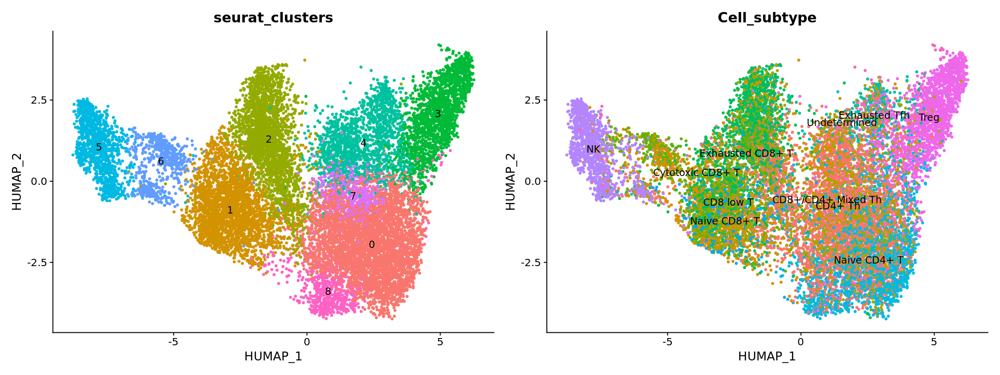

In [103]:
# obj@meta.data$seurat_clusters <- obj@meta.data$humap_fgraph_res.0.8

fig.size(6, 16)
DimPlot(obj, reduction = 'humap', group.by = 'seurat_clusters', label = TRUE, pt.size = 1) + 
    guides(color = 'none') + 
    # scale_color_tableau('Classic 20') +  
    NULL | 
DimPlot(obj, reduction = 'humap', group.by = 'Cell_subtype', label = TRUE, pt.size = 1) + 
    guides(color = 'none') + 
    # scale_color_tableau('Classic 20') + 
    NULL


In [104]:
library(presto)
markers = presto::wilcoxauc(obj, 'seurat_clusters')
markers %>% 
    dplyr::mutate(group = factor(group, 0:19)) %>% 
    top_markers() %>% t()

rank,1,2,3,4,5,6,7,8,9,10
0,IL7R,FOS,JUNB,GPR183,JUN,ANXA1,VIM,CCR7,CD69,TCF7
1,GZMK,GZMA,CCL5,CST7,CCL4,CD74,CD8A,HLA-DRB1,CMC1,CD8B
2,CCL5,CD8A,CD8B,ZNF683,GZMA,CCL4,CD7,ID2,LAG3,ALOX5AP
3,IL32,TIGIT,BATF,TNFRSF4,TRAC,CD27,IL2RA,FOXP3,CD74,CTLA4
4,DUSP4,RBPJ,ALOX5AP,CD2,KLRB1,CXCL13,TRAC,CD3D,ARHGDIB,CXCR6
5,TYROBP,GNLY,PRF1,FGFBP2,FCGR3A,CST7,KLRF1,TRDC,CCL4,CMC1
6,FGFBP2,GNLY,CST7,PRF1,CCL5,CCL4,TRGC1,KLRG1,GZMA,FCGR3A
7,KLRB1,CCL20,RORA,IL7R,VIM,CCR6,TNFSF13B,CXCR4,PERP,TNFRSF25
8,HSPA1B,HSPA1A,JUN,DNAJB1,FOS,IL7R,CD69,FOSB,JUNB,CD40LG


## Markers

In [105]:
meta_data = obj@meta.data
meta_data$cluster = meta_data$seurat_clusters
meta_data$library = meta_data$Sample
counts = obj_all@assays$RNA@counts[, rownames(meta_data)]
# counts = counts[, rownames(meta_data)]


In [106]:
library(singlecellmethods)
library(presto)
library(lme4)
library(future)
library(furrr)
plan(multicore)

In [107]:
pb <- presto::collapse_counts(
    counts, meta_data, 
    c('library', 'cluster'), 
    min_cells_per_group = 10, 
    get_norm = TRUE
)  

system.time({
    suppressWarnings({
        presto_res <- presto.presto(
            y ~ 1 + (1|cluster) + (1|cluster:library) + (1|library) + offset(logUMI), 
            pb$meta_data, 
            pb$counts_mat,
            features = rownames(obj), 
            size_varname = 'logUMI', 
            effects_cov = c('cluster'),
            ncore = 10, 
            min_sigma = .05, 
            family = 'poisson',
            nsim = 1000
        ) 
    })
})

contrasts_mat <- make_contrast.presto(presto_res, 'cluster')
effects_marginal <- contrasts.presto(presto_res, contrasts_mat, one_tailed = TRUE) %>% 
    dplyr::mutate(cluster = contrast) %>% 
    dplyr::mutate(
        ## convert stats to log2 for interpretability 
        logFC = sign(beta) * log2(exp(abs(beta))),
        SD = log2(exp(sigma)),
        zscore = logFC / SD
    ) %>% 
    dplyr::select(cluster, feature, logFC, SD, zscore, pvalue) %>% 
    arrange(pvalue)
effects_marginal$fdr <- p.adjust(effects_marginal$pvalue, method = 'BH')


CAREFUL: get_norm makes very strong assumptions about data

CAUTION: if using GLMM, make sure your counts are integers!

Joining with `by = join_by(grpvar_orig)`


   user  system elapsed 
503.357  10.772  65.247 

In [108]:
# effects_marginal %>% 
#     filter(cluster == '4') %>% 
#     head(10)


In [109]:
effects_marginal %>% 
    split(.$cluster) %>% 
    map(dplyr::arrange, -zscore) %>% 
    map(filter, pvalue < .05) %>% 
    map(head, 5) %>% 
    identity()


cluster,feature,logFC,SD,zscore,pvalue,fdr
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0,LEF1,2.1252841,0.14131487,15.039352,2.027494e-51,2.975738e-49
0,CCR7,2.3015888,0.21119254,10.898059,5.887079e-28,3.456168e-26
0,IL7R,1.9053408,0.18654688,10.213737,8.605250e-25,4.264628e-23
0,FLT3LG,0.9869089,0.09794571,10.076081,3.524085e-24,1.639989e-22
0,TCF7,1.2119824,0.12711869,9.534258,7.548032e-22,3.064180e-20
cluster,feature,logFC,SD,zscore,pvalue,fdr
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,CD8A,2.788833,0.1831166,15.22982,1.121086e-52,1.711226e-50
1,CST7,1.659337,0.1129807,14.68691,3.910019e-49,5.328798e-47


## Cache

In [110]:
fwrite(effects_marginal, 'data/tnk_ref_lee_lung_markers.csv')
obj@meta.data %>% 
    tibble::rownames_to_column('cellid') %>% 
    fwrite('data/tnk_ref_lee_lung_meta.csv')


# B/plasma


## Data

In [8]:
obj_all = readRDS('data/all_ref_lee_lung.rds')
genes_merfish = unique(fread('share/cells/markers_lvl1.csv')$feature)
genes_merfish = intersect(rownames(obj_all), genes_merfish)


In [93]:
table(obj_all@meta.data$Cell_type)


    B lymphocytes Endothelial cells  Epithelial cells       Fibroblasts 
             5781               645             13852              1739 
       MAST cells     Myeloid cells        T/NK cells 
             1809             10123             16568 

## Remove outliers

In [116]:
library(harmony)

In [117]:
fig.size(5, 8)
.verbose = TRUE
obj = subset(obj_all[genes_merfish, ], Cell_type %in% 'B lymphocytes') 


Warning message:
“Removing 6705 cells missing data for vars requested”


Warning message:
“Cannot find a parent environment called Seurat”
Warning message:
“The following arguments are not used: nselect”
Centering and scaling data matrix

PC_ 1 
Positive:  MZB1, XBP1, MANF, HSPA5, CD38, PRDM1, CD27, GAS6, HLA-C, JUN 
	   TIMP1, IFNAR2, ISG20, MLEC, PECAM1, HSPA1B, CCR10, FOS, VIM, IFNAR1 
	   HSPA1A, ISG15, FOSB, TNFRSF4, DNAJB1, DPEP1, WARS, PERP, LY6E, IER2 
Negative:  HLA-DRA, HLA-DRB1, CD74, MS4A1, CXCR4, IRF8, ARHGDIB, CD69, GPR183, CCR7 
	   SELL, PTPRC, CXCR5, CD19, SKIL, CCR6, HIF1A, JUNB, TNFRSF13B, CD40 
	   CD1C, ALOX5AP, S1PR2, SMAD3, HMGB2, BIRC3, ZBTB16, IL6, LST1, S1PR1 
PC_ 2 
Positive:  MZB1, CD79A, XBP1, GAS6, CCL18, MANF, ISG20, S100A9, CD38, PECAM1 
	   C1QA, IFNAR2, TSPAN13, HSPA5, C1QB, CXCL2, TM4SF1, CCR10, CCL2, APOE 
	   CXCL8, TIMP1, LCN2, IFNAR1, ISG15, LYZ, C1QC, CXCL3, KRT8, PRDM1 
Negative:  CD2, IL32, CCL5, CD3E, CD3D, IL7R, CD7, TRAC, CD3G, CD8A 
	   GZMA, CST7, ID2, GZMK, CD8B, ANXA1, GATA3, KLRB1, CD247, PRF1 
	   CCL4, CD4

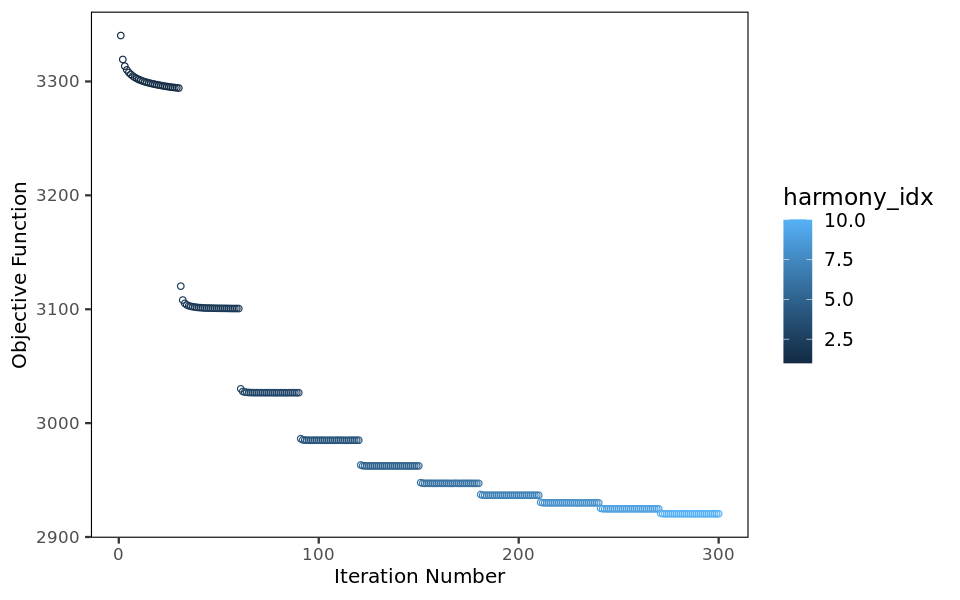

In [118]:
obj = obj %>% 
        Seurat::NormalizeData(scale.factor = median(obj@meta.data$nCount_RNA)) %>% 
        Seurat::FindVariableFeatures() %>% 
        Seurat::ScaleData(verbose = .verbose) %>% 
        Seurat::RunPCA(npcs = 30, verbose = .verbose) %>% 
        RunHarmony(
            'Sample', plot_convergence = TRUE, 
            epsilon.cluster = -Inf, epsilon.harmony = -Inf, 
            max.iter.harmony = 10, max.iter.cluster = 30, 
            theta = 1
        ) 

In [119]:
system.time({
    U <- uwot::umap(obj@reductions$harmony@cell.embeddings, min_dist = 0.3, spread = 1.0, ret_extra = 'fgraph', fast_sgd = TRUE, n_sgd_threads = 40)     
})

colnames(U$embedding) <- c('HUMAP1', 'HUMAP2')
rownames(U$fgraph) <- colnames(U$fgraph) <- Cells(obj)

obj[['humap']] <- Seurat::CreateDimReducObject(
    embeddings = U$embedding,
    assay = 'RNA', 
    key = 'HUMAP_', 
    global = TRUE
)
new_graph <- Seurat::as.Graph(U$fgraph)
DefaultAssay(new_graph) <- DefaultAssay(obj)
obj[['humap_fgraph']] <- new_graph


   user  system elapsed 
 11.564   0.482   3.774 

In [120]:
## Define lots of different resolutions to try out 
resolutions_test <- seq(.01, 0.8, length.out = 10)

## Run FindClusters with multiple cores
system.time({
    suppressWarnings({
        obj <- Seurat::FindClusters(obj, graph.name = 'humap_fgraph', resolution = resolutions_test, verbose = FALSE)        
    })
})


   user  system elapsed 
  4.670   1.852   1.431 

In [121]:
obj@meta.data %>% 
    dplyr::select(matches('humap_fgraph_res')) %>% 
    map_int(nlevels)


humap_fgraph_res.0.01 humap_fgraph_res.0.0977777777777778 
                                  1                                   5 
 humap_fgraph_res.0.185555555555556  humap_fgraph_res.0.273333333333333 
                                  5                                   6 
 humap_fgraph_res.0.361111111111111  humap_fgraph_res.0.448888888888889 
                                  7                                  10 
 humap_fgraph_res.0.536666666666667  humap_fgraph_res.0.624444444444445 
                                  9                                  11 
 humap_fgraph_res.0.712222222222222                humap_fgraph_res.0.8 
                                 13                                  14

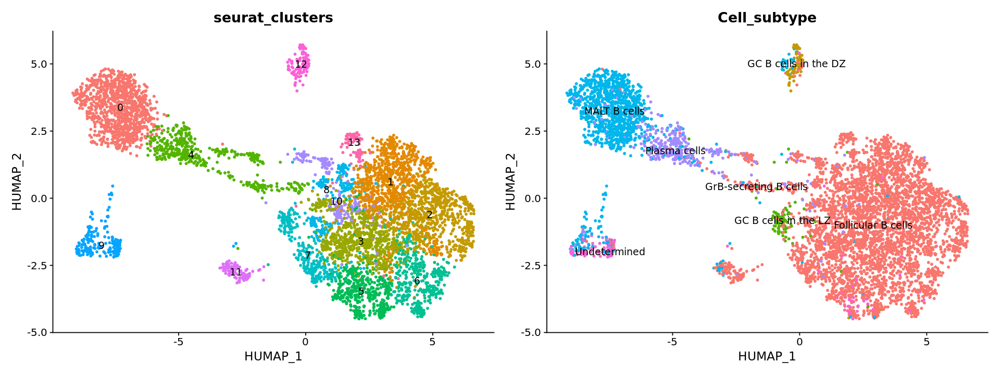

In [125]:
obj@meta.data$seurat_clusters <- obj@meta.data$humap_fgraph_res.0.8

fig.size(6, 16)
DimPlot(obj, reduction = 'humap', group.by = 'seurat_clusters', label = TRUE, pt.size = 1) + 
    guides(color = 'none') + 
    # scale_color_tableau('Classic 20') +  
    NULL | 
DimPlot(obj, reduction = 'humap', group.by = 'Cell_subtype', label = TRUE, pt.size = 1) + 
    guides(color = 'none') + 
    # scale_color_tableau('Classic 20') + 
    NULL


In [126]:
library(presto)
markers = presto::wilcoxauc(obj, 'seurat_clusters')

In [127]:
markers %>% 
    filter(feature %in% c('CD3E', 'CD68', 'CD19', 'COL3A1', 'CPA3', 'EPCAM', 'ACKR1', 'NOTCH3')) %>% 
    filter(auc > .55) %>% 
    arrange(-auc)


markers %>% 
    dplyr::mutate(group = factor(group, 0:19)) %>% 
    top_markers() %>% t()

feature,group,avgExpr,logFC,statistic,auc,pval,padj,pct_in,pct_out
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
CD3E,9,0.4050821,0.39158867,880854.0,0.8420538,0.000000e+00,0.000000e+00,70.58824,2.306042
CD19,12,0.2811662,0.10384603,376719.0,0.6148667,6.523422e-08,5.649284e-07,51.85185,24.272871
CD19,7,0.2933406,0.11969134,866666.5,0.5804050,3.522522e-09,6.932964e-08,39.85240,24.047187
CD19,6,0.2650596,0.09185302,1139068.5,0.5536446,3.752913e-06,4.166695e-05,33.85827,24.148148


rank,1,2,3,4,5,6,7,8,9,10
0,MZB1,XBP1,MANF,JUN,HSPA5,HLA-C,CD27,ISG20,CD38,PRDM1
1,HLA-DRB1,CXCR4,CD74,BIRC3,HLA-DRA,CD69,JUNB,CCR7,SELL,CD79A
2,CD69,JUNB,FOSB,CXCR4,IER2,KLF2,GPR183,FOS,MS4A1,HLA-DRB1
3,HLA-DRA,CD74,HLA-DRB1,CXCR4,GPR183,MS4A1,TCF7,IRF8,ARHGDIB,HLA-E
4,MZB1,HLA-C,XBP1,APOE,TYROBP,AIF1,SERPINA1,MANF,C1QB,C1QA
5,HLA-DRA,MS4A1,DUSP4,HLA-DRB1,CD74,PSMB9,TNFRSF13B,GPR183,STAT1,GBP4
6,CD1C,GPR183,ARHGDIB,TNFRSF13B,MS4A1,CXCR4,CXCR5,IL2RA,CCR6,PSMB9
7,CD74,HLA-DRA,MS4A1,TOX,CD40,HLA-DRB1,TRAC,ARHGDIB,PTPRC,IRF8
8,HLA-DRA,CD74,HLA-DRB1,FLI1,MS4A1,VEGFB,CXCR4,IFNGR1,IRF8,ENTPD1
9,IL32,CD3D,CD2,CD3E,TRAC,CCL5,ANXA1,CD7,ID2,GZMA


Filter on poor QC clusters. 

In [128]:
clusters_keep = setdiff(unique(obj@meta.data$seurat_clusters), c('9', '12', '11'))

obj = subset(obj, seurat_clusters %in% clusters_keep)


Same, after filtering. 

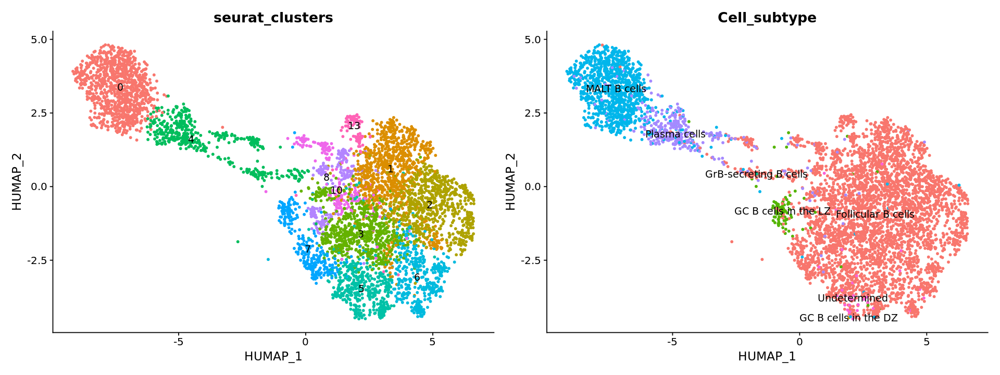

In [129]:
# obj@meta.data$seurat_clusters <- obj@meta.data$humap_fgraph_res.0.8

fig.size(6, 16)
DimPlot(obj, reduction = 'humap', group.by = 'seurat_clusters', label = TRUE, pt.size = 1) + 
    guides(color = 'none') + 
    # scale_color_tableau('Classic 20') +  
    NULL | 
DimPlot(obj, reduction = 'humap', group.by = 'Cell_subtype', label = TRUE, pt.size = 1) + 
    guides(color = 'none') + 
    # scale_color_tableau('Classic 20') + 
    NULL


In [130]:
library(presto)
markers = presto::wilcoxauc(obj, 'seurat_clusters')
markers %>% 
    dplyr::mutate(group = factor(group, 0:19)) %>% 
    top_markers() %>% t()

rank,1,2,3,4,5,6,7,8,9,10
0,MZB1,XBP1,MANF,JUN,HSPA5,HLA-C,CD27,ISG20,CD38,PRDM1
1,HLA-DRB1,BIRC3,CXCR4,CD74,HLA-DRA,CD69,JUNB,CCR7,SELL,CD79A
2,CD69,JUNB,FOSB,IER2,CXCR4,KLF2,FOS,GPR183,MS4A1,EGR1
3,HLA-DRA,CD74,HLA-DRB1,CXCR4,GPR183,TCF7,MS4A1,IRF8,ARHGDIB,HLA-E
4,MZB1,HLA-C,XBP1,APOE,TYROBP,AIF1,SERPINA1,MANF,C1QB,CD27
5,HLA-DRA,MS4A1,DUSP4,HLA-DRB1,PSMB9,CD74,STAT1,TNFRSF13B,GBP4,GPR183
6,CD1C,ARHGDIB,GPR183,TNFRSF13B,MS4A1,CXCR4,CXCR5,PSMB9,IL2RA,CCR6
7,CD74,HLA-DRA,MS4A1,TOX,CD40,TRAC,HLA-DRB1,ARHGDIB,PTPRC,IRF8
8,HLA-DRA,CD74,HLA-DRB1,FLI1,MS4A1,VEGFB,CXCR4,IFNGR1,IRF8,ENTPD1
10,HLA-DRA,ALOX5,CD74,MARCO,HLA-DRB1,CXCR4,SELL,MS4A1,PSMB8,CXCL16


## Markers

In [131]:
meta_data = obj@meta.data
meta_data$cluster = meta_data$seurat_clusters
meta_data$library = meta_data$Sample
counts = obj_all@assays$RNA@counts[, rownames(meta_data)]
# counts = counts[, rownames(meta_data)]


In [132]:
library(singlecellmethods)
library(presto)
library(lme4)
library(future)
library(furrr)
plan(multicore)

In [133]:
pb <- presto::collapse_counts(
    counts, meta_data, 
    c('library', 'cluster'), 
    min_cells_per_group = 10, 
    get_norm = TRUE
)  

system.time({
    suppressWarnings({
        presto_res <- presto.presto(
            y ~ 1 + (1|cluster) + (1|cluster:library) + (1|library) + offset(logUMI), 
            pb$meta_data, 
            pb$counts_mat,
            features = rownames(obj), 
            size_varname = 'logUMI', 
            effects_cov = c('cluster'),
            ncore = 10, 
            min_sigma = .05, 
            family = 'poisson',
            nsim = 1000
        ) 
    })
})

contrasts_mat <- make_contrast.presto(presto_res, 'cluster')
effects_marginal <- contrasts.presto(presto_res, contrasts_mat, one_tailed = TRUE) %>% 
    dplyr::mutate(cluster = contrast) %>% 
    dplyr::mutate(
        ## convert stats to log2 for interpretability 
        logFC = sign(beta) * log2(exp(abs(beta))),
        SD = log2(exp(sigma)),
        zscore = logFC / SD
    ) %>% 
    dplyr::select(cluster, feature, logFC, SD, zscore, pvalue) %>% 
    arrange(pvalue)
effects_marginal$fdr <- p.adjust(effects_marginal$pvalue, method = 'BH')


CAREFUL: get_norm makes very strong assumptions about data

CAUTION: if using GLMM, make sure your counts are integers!

Joining with `by = join_by(grpvar_orig)`


   user  system elapsed 
485.096  10.056  59.257 

In [134]:
# effects_marginal %>% 
#     filter(cluster == '4') %>% 
#     head(10)


In [138]:
effects_marginal %>% 
    split(.$cluster) %>% 
    map(dplyr::arrange, -logFC) %>% 
    # map(dplyr::arrange, -zscore) %>% 
    map(filter, pvalue < .05) %>% 
    map(head, 10) %>% 
    identity()


cluster,feature,logFC,SD,zscore,pvalue,fdr
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0,DPEP1,8.415081,3.2228445,2.611073,4.512938e-03,1.015443e-01
0,MZB1,4.799096,1.4726389,3.258841,5.593412e-04,2.007992e-02
0,XBP1,4.305072,1.0268730,4.192409,1.380038e-05,8.754737e-04
0,CCR10,4.276956,2.3342501,1.832261,3.345625e-02,4.233221e-01
0,PRDM1,4.162470,0.8854865,4.700772,1.295900e-06,1.154099e-04
0,GAS6,3.937900,0.7852247,5.014998,2.651703e-07,2.995131e-05
0,MANF,2.917814,1.1153359,2.616086,4.447212e-03,1.014534e-01
0,CD38,2.877722,0.8717010,3.301272,4.812377e-04,1.824188e-02
0,HSPA1B,2.665710,0.4768683,5.590033,1.135132e-08,1.752265e-06


## Cache

In [139]:
fwrite(effects_marginal, 'data/bplasma_ref_lee_lung_markers.csv')
obj@meta.data %>% 
    tibble::rownames_to_column('cellid') %>% 
    fwrite('data/bplasma_ref_lee_lung_meta.csv')


# Mast 

## Data

In [8]:
obj_all = readRDS('data/all_ref_lee_lung.rds')
genes_merfish = unique(fread('share/cells/markers_lvl1.csv')$feature)
genes_merfish = intersect(rownames(obj_all), genes_merfish)


In [93]:
table(obj_all@meta.data$Cell_type)


    B lymphocytes Endothelial cells  Epithelial cells       Fibroblasts 
             5781               645             13852              1739 
       MAST cells     Myeloid cells        T/NK cells 
             1809             10123             16568 

## Remove outliers

In [140]:
library(harmony)

In [141]:
fig.size(5, 8)
.verbose = TRUE
obj = subset(obj_all[genes_merfish, ], Cell_type %in% 'MAST cells') 


Warning message:
“Removing 6705 cells missing data for vars requested”


Warning message:
“Cannot find a parent environment called Seurat”
Warning message:
“The following arguments are not used: nselect”
Centering and scaling data matrix

PC_ 1 
Positive:  HPGDS, FCER1A, ANXA1, TYROBP, FOSB, MS4A2, CD69, CTSG, CSF1, KIT 
	   LYZ, STMN1, ALOX5AP, TIMP1, IFNAR1, BIRC3, APOE, VIM, HEY1, CXCL16 
	   ICAM1, CCL2, ITGAX, CPA3, VEGFA, TSPAN6, PTGS2, SKIL, CCL17, STARD10 
Negative:  TRAC, IL32, CD3D, CXCR4, CCL5, IL7R, CD2, RORA, CD3E, GZMA 
	   GZMK, KLRB1, CD3G, CCR7, CD7, HLA-C, TNFRSF1B, ISG20, CXCR3, CD8B 
	   PSMB9, CD27, DNAJB1, RARRES3, HLA-E, GPR183, PRF1, CD247, TCF7, HLA-DRB1 
PC_ 2 
Positive:  JUN, FOS, IER2, CD69, JUNB, HSPA1B, CTSG, HSPA1A, SOX4, HSPA5 
	   KLF2, EGR1, DNAJB1, FOSB, CLNK, IRF1, CSF1, FCER1A, CCL18, XBP1 
	   G0S2, SPP1, PCNA, ANXA1, FN1, PDCD1LG2, S100A8, CD79A, MX1, FZD1 
Negative:  BIRC3, ID2, VEGFA, SKIL, TNFRSF9, DUSP6, IFNGR2, VIM, HLA-DRA, PTGS2 
	   HIF1A, LYZ, CD74, CPA3, BHLHE40, TNFRSF4, TYROBP, SLC26A2, KIT, MS4A2 
	   TGFB

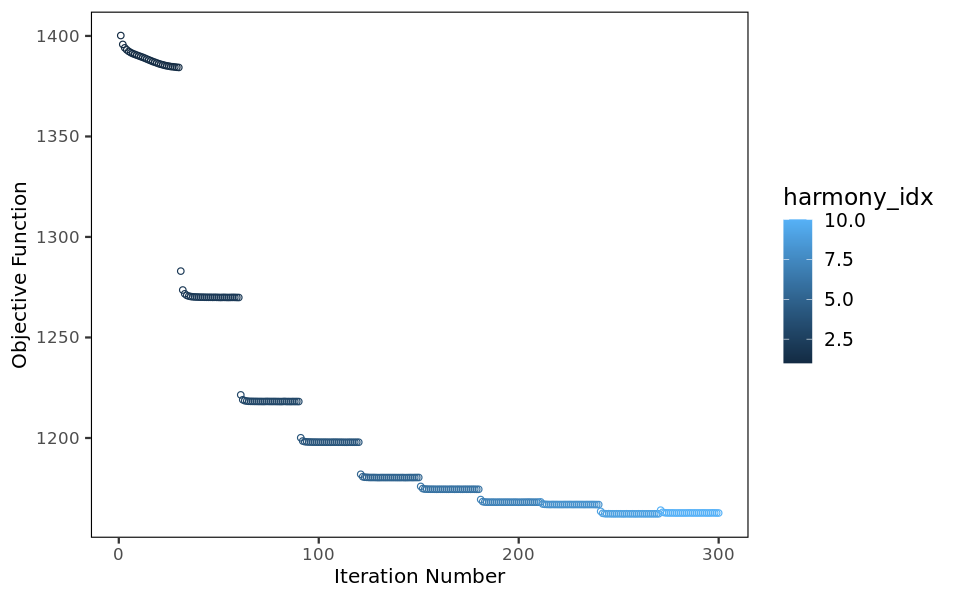

In [142]:
obj = obj %>% 
        Seurat::NormalizeData(scale.factor = median(obj@meta.data$nCount_RNA)) %>% 
        Seurat::FindVariableFeatures() %>% 
        Seurat::ScaleData(verbose = .verbose) %>% 
        Seurat::RunPCA(npcs = 30, verbose = .verbose) %>% 
        RunHarmony(
            'Sample', plot_convergence = TRUE, 
            epsilon.cluster = -Inf, epsilon.harmony = -Inf, 
            max.iter.harmony = 10, max.iter.cluster = 30, 
            theta = 1
        ) 

In [143]:
system.time({
    U <- uwot::umap(obj@reductions$harmony@cell.embeddings, min_dist = 0.3, spread = 1.0, ret_extra = 'fgraph', fast_sgd = TRUE, n_sgd_threads = 40)     
})

colnames(U$embedding) <- c('HUMAP1', 'HUMAP2')
rownames(U$fgraph) <- colnames(U$fgraph) <- Cells(obj)

obj[['humap']] <- Seurat::CreateDimReducObject(
    embeddings = U$embedding,
    assay = 'RNA', 
    key = 'HUMAP_', 
    global = TRUE
)
new_graph <- Seurat::as.Graph(U$fgraph)
DefaultAssay(new_graph) <- DefaultAssay(obj)
obj[['humap_fgraph']] <- new_graph


   user  system elapsed 
  5.023   0.438   2.628 

In [144]:
## Define lots of different resolutions to try out 
resolutions_test <- seq(.01, 0.8, length.out = 10)

## Run FindClusters with multiple cores
system.time({
    suppressWarnings({
        obj <- Seurat::FindClusters(obj, graph.name = 'humap_fgraph', resolution = resolutions_test, verbose = FALSE)        
    })
})


   user  system elapsed 
  1.307   1.813   1.072 

In [145]:
obj@meta.data %>% 
    dplyr::select(matches('humap_fgraph_res')) %>% 
    map_int(nlevels)


humap_fgraph_res.0.01 humap_fgraph_res.0.0977777777777778 
                                  1                                   2 
 humap_fgraph_res.0.185555555555556  humap_fgraph_res.0.273333333333333 
                                  4                                   7 
 humap_fgraph_res.0.361111111111111  humap_fgraph_res.0.448888888888889 
                                  7                                   9 
 humap_fgraph_res.0.536666666666667  humap_fgraph_res.0.624444444444445 
                                 11                                  13 
 humap_fgraph_res.0.712222222222222                humap_fgraph_res.0.8 
                                 13                                  19

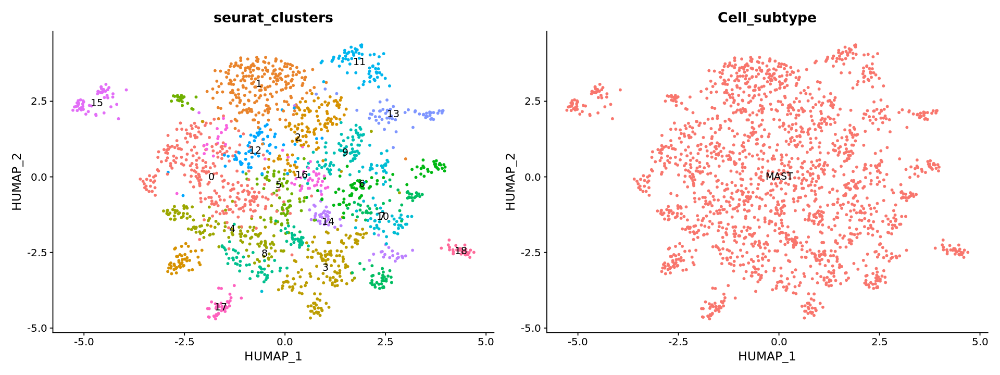

In [146]:
obj@meta.data$seurat_clusters <- obj@meta.data$humap_fgraph_res.0.8

fig.size(6, 16)
DimPlot(obj, reduction = 'humap', group.by = 'seurat_clusters', label = TRUE, pt.size = 1) + 
    guides(color = 'none') + 
    # scale_color_tableau('Classic 20') +  
    NULL | 
DimPlot(obj, reduction = 'humap', group.by = 'Cell_subtype', label = TRUE, pt.size = 1) + 
    guides(color = 'none') + 
    # scale_color_tableau('Classic 20') + 
    NULL


In [147]:
library(presto)
markers = presto::wilcoxauc(obj, 'seurat_clusters')

In [ ]:
'15'

In [148]:
markers %>% 
    filter(feature %in% c('CD3E', 'CD68', 'CD19', 'COL3A1', 'CPA3', 'EPCAM', 'ACKR1', 'NOTCH3')) %>% 
    filter(auc > .55) %>% 
    arrange(-auc)


markers %>% 
    dplyr::mutate(group = factor(group, 0:19)) %>% 
    top_markers() %>% t()

feature,group,avgExpr,logFC,statistic,auc,pval,padj,pct_in,pct_out
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
CD3E,15,0.2513719,0.2478727,67282.5,0.7099557,4.208599e-114,4.555808e-112,42.59259,0.5698006
CPA3,13,2.3091334,0.3393751,67645.0,0.6660726,1.638214e-05,4.728978e-04,100.00000,97.0302684
CPA3,8,2.2890255,0.3220962,87152.0,0.6534897,5.018768e-06,1.671636e-04,100.00000,96.9976905
CPA3,10,2.2491646,0.2791737,77833.5,0.6482884,2.869077e-05,8.873644e-04,97.10145,97.1264368
CPA3,14,2.2449861,0.2726359,61523.0,0.6377423,4.950634e-04,2.143625e-02,100.00000,97.0353478
CPA3,7,2.2413539,0.2724625,85650.5,0.6343636,5.820454e-05,2.520256e-03,98.71795,97.0537262
CPA3,4,2.2114452,0.2488247,136873.0,0.6226651,2.830288e-06,8.753676e-05,99.23664,96.9606675
CPA3,6,2.1792252,0.2076543,80663.0,0.5902027,6.624269e-03,1.062336e-01,98.73418,97.0520231
CPA3,2,2.0932343,0.1236699,149488.0,0.5602705,1.124939e-02,1.132787e-01,98.76543,96.9641773


rank,1,2,3,4,5,6,7,8,9,10
0,CTSG,ANXA1,BIRC3,HPGDS,FCER1A,CSF1,CD69,ICAM1,LYZ,TSPAN6
1,FOS,JUN,CD69,IER2,JUNB,EGR1,FOSB,CSF1,IRF1,KLF2
2,HLA-C,CD74,HLA-E,FOS,IRF1,HLA-DRB1,HLA-DRA,STAT1,PSMB9,PSMB8
3,ID2,BIRC3,PHLDA1,VIM,DUSP4,OSM,TYROBP,VEGFA,BATF,HIF1A
4,TIMP1,HPGDS,ALOX5AP,ANXA1,VIM,CPA3,MANF,IFNGR2,FCER1A,CTSG
5,VIM,SMARCA4,SMAD7,CLNK,TGFBR2,HPGDS,ARHGDIB,TYROBP,FCER1A,FOSB
6,LY6E,ISG15,PSMB9,MX1,HLA-C,PSMB8,VIM,CPA3,ALOX5,ALOX5AP
7,ID2,CPA3,BIRC3,SQLE,SKIL,KIT,ARID3A,KRT8,TM4SF1,HLA-C
8,BIRC3,CPA3,ID2,MLEC,ICAM1,ITGAX,IL2RA,CST7,MS4A2,CSF2RB
9,XBP1,MANF,HSPA5,HIF1A,TIMP1,IL6R,FOS,ITGB7,FOSB,APOE


Filter on poor QC clusters. 

In [149]:
clusters_keep = setdiff(unique(obj@meta.data$seurat_clusters), c('15'))

obj = subset(obj, seurat_clusters %in% clusters_keep)


Same, after filtering. 

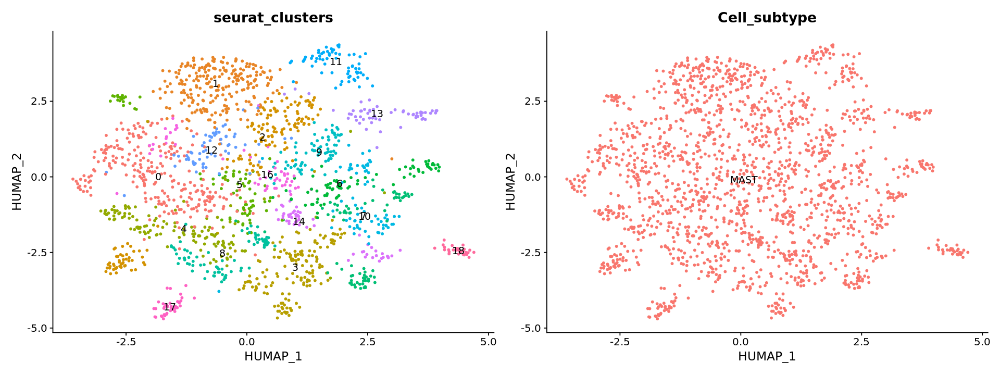

In [150]:
# obj@meta.data$seurat_clusters <- obj@meta.data$humap_fgraph_res.0.8

fig.size(6, 16)
DimPlot(obj, reduction = 'humap', group.by = 'seurat_clusters', label = TRUE, pt.size = 1) + 
    guides(color = 'none') + 
    # scale_color_tableau('Classic 20') +  
    NULL | 
DimPlot(obj, reduction = 'humap', group.by = 'Cell_subtype', label = TRUE, pt.size = 1) + 
    guides(color = 'none') + 
    # scale_color_tableau('Classic 20') + 
    NULL


In [151]:
library(presto)
markers = presto::wilcoxauc(obj, 'seurat_clusters')
markers %>% 
    dplyr::mutate(group = factor(group, 0:19)) %>% 
    top_markers() %>% t()

rank,1,2,3,4,5,6,7,8,9,10
0,CTSG,ANXA1,BIRC3,HPGDS,FCER1A,CSF1,CD69,ICAM1,LYZ,TSPAN6
1,JUN,FOS,CD69,IER2,JUNB,EGR1,FOSB,IRF1,CSF1,KLF2
2,HLA-C,HLA-E,CD74,FOS,IRF1,HLA-DRB1,HLA-DRA,STAT1,PSMB9,PSMB8
3,ID2,BIRC3,PHLDA1,VIM,DUSP4,OSM,VEGFA,BATF,TYROBP,HIF1A
4,TIMP1,HPGDS,ALOX5AP,ANXA1,VIM,CPA3,MANF,IFNGR2,CTSG,FCER1A
5,VIM,SMARCA4,SMAD7,CLNK,TGFBR2,ARHGDIB,HPGDS,TYROBP,FCER1A,PTPRC
6,LY6E,ISG15,PSMB9,MX1,HLA-C,PSMB8,VIM,ALOX5,CPA3,ALOX5AP
7,ID2,CPA3,BIRC3,SQLE,SKIL,KIT,ARID3A,KRT8,TM4SF1,HLA-C
8,BIRC3,CPA3,ID2,MLEC,ITGAX,ICAM1,IL2RA,CST7,CSF2RB,MS4A2
9,XBP1,MANF,HSPA5,HIF1A,IL6R,TIMP1,ITGB7,FOS,FOSB,APOE


## Markers

In [152]:
meta_data = obj@meta.data
meta_data$cluster = meta_data$seurat_clusters
meta_data$library = meta_data$Sample
counts = obj_all@assays$RNA@counts[, rownames(meta_data)]
# counts = counts[, rownames(meta_data)]


In [153]:
library(singlecellmethods)
library(presto)
library(lme4)
library(future)
library(furrr)
plan(multicore)

In [154]:
pb <- presto::collapse_counts(
    counts, meta_data, 
    c('library', 'cluster'), 
    min_cells_per_group = 10, 
    get_norm = TRUE
)  

system.time({
    suppressWarnings({
        presto_res <- presto.presto(
            y ~ 1 + (1|cluster) + (1|cluster:library) + (1|library) + offset(logUMI), 
            pb$meta_data, 
            pb$counts_mat,
            features = rownames(obj), 
            size_varname = 'logUMI', 
            effects_cov = c('cluster'),
            ncore = 10, 
            min_sigma = .05, 
            family = 'poisson',
            nsim = 1000
        ) 
    })
})

contrasts_mat <- make_contrast.presto(presto_res, 'cluster')
effects_marginal <- contrasts.presto(presto_res, contrasts_mat, one_tailed = TRUE) %>% 
    dplyr::mutate(cluster = contrast) %>% 
    dplyr::mutate(
        ## convert stats to log2 for interpretability 
        logFC = sign(beta) * log2(exp(abs(beta))),
        SD = log2(exp(sigma)),
        zscore = logFC / SD
    ) %>% 
    dplyr::select(cluster, feature, logFC, SD, zscore, pvalue) %>% 
    arrange(pvalue)
effects_marginal$fdr <- p.adjust(effects_marginal$pvalue, method = 'BH')


CAREFUL: get_norm makes very strong assumptions about data

CAUTION: if using GLMM, make sure your counts are integers!

Joining with `by = join_by(grpvar_orig)`


   user  system elapsed 
415.335   9.861  54.159 

In [155]:
# effects_marginal %>% 
#     filter(cluster == '4') %>% 
#     head(10)


In [156]:
effects_marginal %>% 
    split(.$cluster) %>% 
    map(dplyr::arrange, -zscore) %>% 
    map(filter, pvalue < .05) %>% 
    map(head, 5) %>% 
    identity()


cluster,feature,logFC,SD,zscore,pvalue,fdr
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0,ANXA1,0.7123845,0.2087635,3.412400,0.0003219678,0.2644289
0,BIRC3,0.7311637,0.2480134,2.948081,0.0015987668,0.5235541
0,CTSG,1.6170953,0.6315038,2.560705,0.0052229938,0.7103436
0,CSF1,1.0716138,0.5250083,2.041137,0.0206186067,0.7103436
0,HEY1,0.9468940,0.4998371,1.894405,0.0290856127,0.7103436
cluster,feature,logFC,SD,zscore,pvalue,fdr
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,IER2,2.289234,0.5836134,3.922517,4.381426e-05,0.1567007
1,CD69,2.048071,0.5404967,3.789239,7.555480e-05,0.1567007


## Cache

In [158]:
fwrite(effects_marginal, 'data/mast_ref_lee_lung_markers.csv')
obj@meta.data %>% 
    tibble::rownames_to_column('cellid') %>% 
    fwrite('data/mast_ref_lee_lung_meta.csv')


# Get stromal

## PCA etc. 

In [29]:
.verbose = TRUE
obj = obj %>% 
        Seurat::NormalizeData(scale.factor = median(obj@meta.data$nCount_RNA)) %>% 
        Seurat::FindVariableFeatures() %>% 
        Seurat::ScaleData(verbose = .verbose) %>% 
        Seurat::RunPCA(npcs = 30, verbose = .verbose) 


Warning message:
“The following arguments are not used: nselect”
Centering and scaling data matrix

PC_ 1 
Positive:  HLA-DPB1, ALOX5AP, HLA-DRB1, HLA-DPA1, TYROBP, LTB, CD69, GPR183, FCER1G, HLA-DRA 
	   HLA-DQA1, HLA-DQB1, AIF1, C1orf162, CCL4, IGKC, LYZ, LST1, CD68, HLA-DMB 
	   SPI1, C1QA, BCL2A1, C1QB, FCGR3A, NKG7, MS4A6A, APOC1, C1QC, LY86 
Negative:  KRT19, CLDN4, MUC1, KRT18, ELF3, KRT8, KRT7, MDK, WFDC2, MAL2 
	   GPRC5A, MGST1, S100A14, TACSTD2, SLC34A2, EPCAM, TM4SF1, CCND1, CEACAM6, CLDN3 
	   HSPB1, RAB25, FXYD3, SMIM22, NAPSA, SDC4, C8orf4, AGR3, SDC1, SLPI 
PC_ 2 
Positive:  OCIAD2, BIRC3, CLDN4, S100A14, LTB, KRT19, MAL2, MUC1, ELF3, KRT7 
	   SLC34A2, CD69, KRT8, KRT18, HOPX, PLPP2, SFN, FAM83A, RAB25, KRTCAP3 
	   NAPSA, SMIM22, WFDC2, PRSS8, ASS1, NKG7, EPCAM, LY6D, SLPI, SLC22A31 
Negative:  DCN, LUM, COL1A2, MMP2, BGN, A2M, FBLN1, C1S, RARRES2, SPARC 
	   COL6A2, SERPINF1, SERPING1, MFAP4, MGP, COL6A3, AEBP1, COL3A1, PCOLCE, IGFBP7 
	   C1R, CALD1, EMILIN1, COL6A1

In [30]:
plan(multicore)
system.time({
    U <- uwot::umap(obj@reductions$pca@cell.embeddings, min_dist = 0.3, spread = 1.0, ret_extra = 'fgraph', fast_sgd = TRUE, n_sgd_threads = 10)  
})

colnames(U$embedding) <- c('UMAP1', 'UMAP2')
rownames(U$fgraph) <- colnames(U$fgraph) <- Cells(obj)

obj[['umap']] <- Seurat::CreateDimReducObject(
    embeddings = U$embedding,
    assay = 'RNA', 
    key = 'UMAP_', 
    global = TRUE
)
new_graph <- Seurat::as.Graph(U$fgraph)
DefaultAssay(new_graph) <- DefaultAssay(obj)
obj[['umap_fgraph']] <- new_graph


   user  system elapsed 
 48.771   0.723  18.885 

## Plot

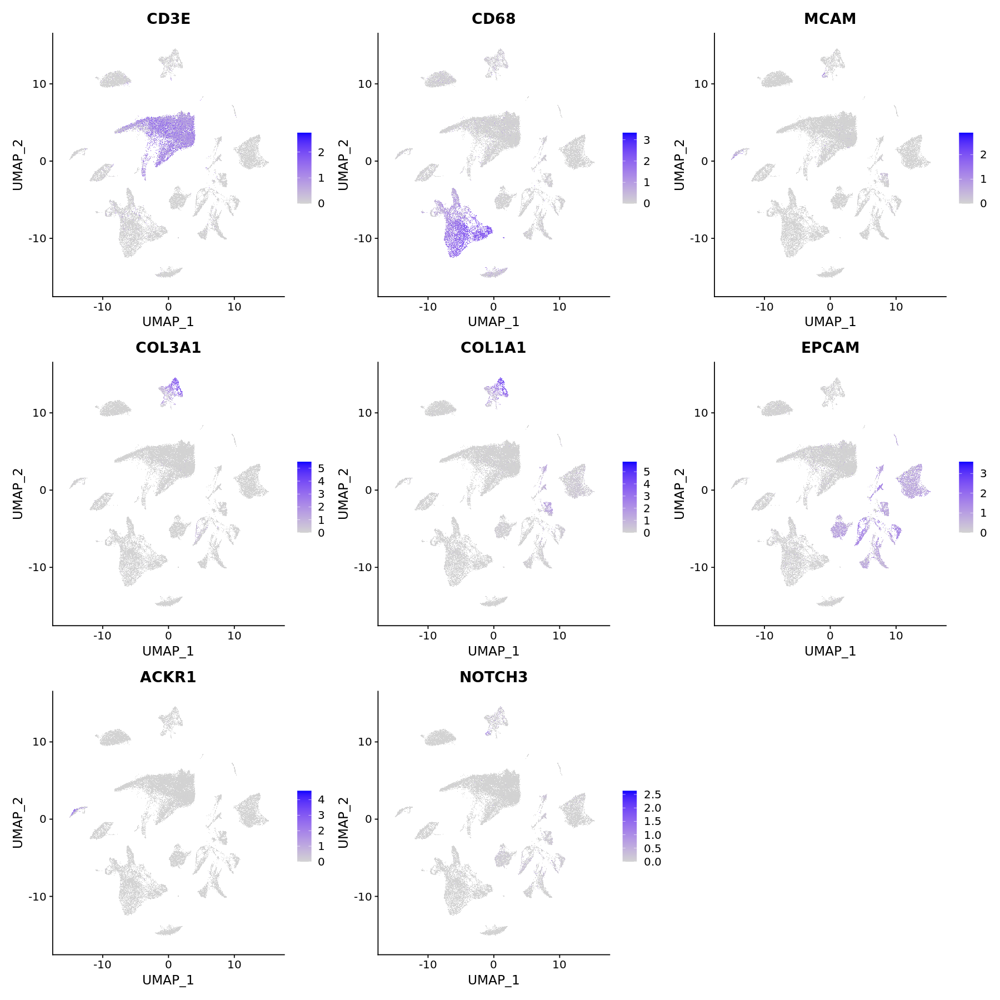

In [31]:
fig.size(15, 15)
FeaturePlot(obj, features = c('CD3E', 'CD68', 'MCAM', 'COL3A1', 'COL1A1', 'EPCAM', 'ACKR1', 'NOTCH3'), ncol = 3, reduction = 'umap', raster = TRUE)  


Warning message:
“Removed 6705 rows containing missing values (`geom_point()`).”


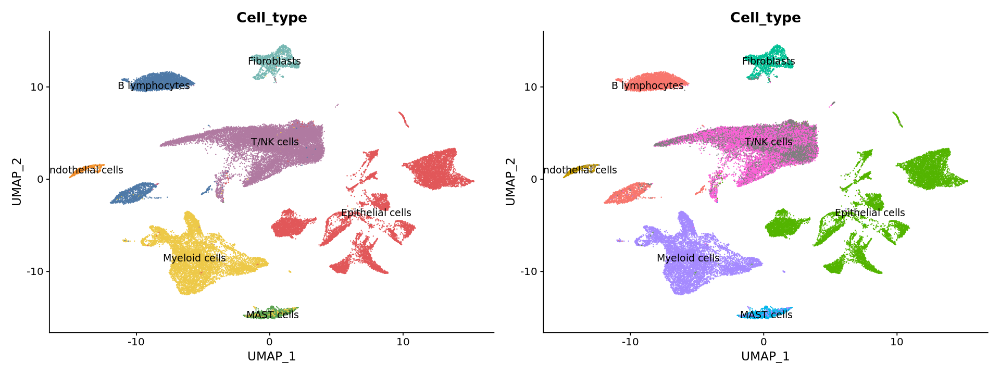

In [39]:
fig.size(6, 16)
DimPlot(obj, group.by = 'Cell_type', label = TRUE) + guides(color = 'none') + scale_color_tableau()  | 
DimPlot(obj, group.by = 'Cell_type', label = TRUE) + guides(color = 'none')


In [45]:
i = which(obj@meta.data$Cell_type %in% c('Endothelial cells', 'Fibroblasts'))
table(obj@meta.data$Cell_type[i])
table(obj@meta.data$Cell_subtype[i])



Endothelial cells       Fibroblasts 
              645              1739 


COL13A1+ matrix FBs COL14A1+ matrix FBs                EPCs       Lymphatic ECs 
                716                 390                  10                  74 
  Mesothelial cells      Myofibroblasts           Pericytes Smooth muscle cells 
                 22                 297                  54                 146 
     Stalk-like ECs        Tip-like ECs           Tumor ECs        Undetermined 
                103                 168                 290                 114 

In [38]:
# i = which(
#     (
#         between(obj@reductions$umap@cell.embeddings[, 'UMAP_1'], -2, 2) & 
#         between(obj@reductions$umap@cell.embeddings[, 'UMAP_2'], 9, 15)    
#     ) | 
    
# )


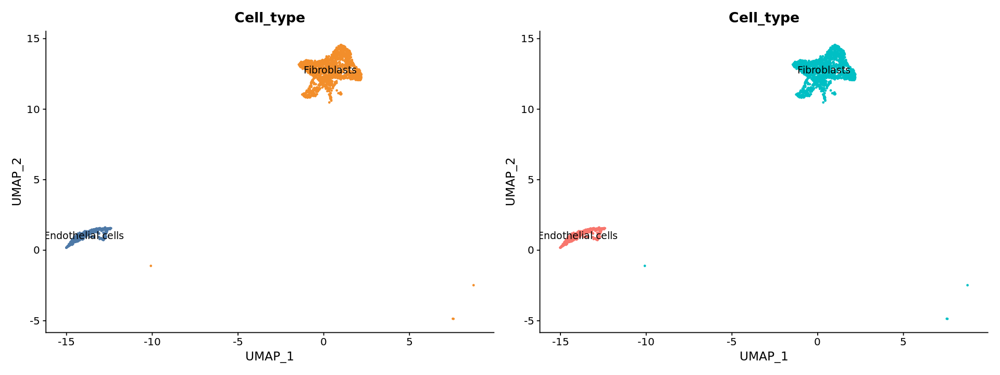

In [47]:
fig.size(6, 16)
DimPlot(obj[, i], group.by = 'Cell_type', label = TRUE) + guides(color = 'none') + scale_color_tableau()  | 
DimPlot(obj[, i], group.by = 'Cell_type', label = TRUE) + guides(color = 'none')


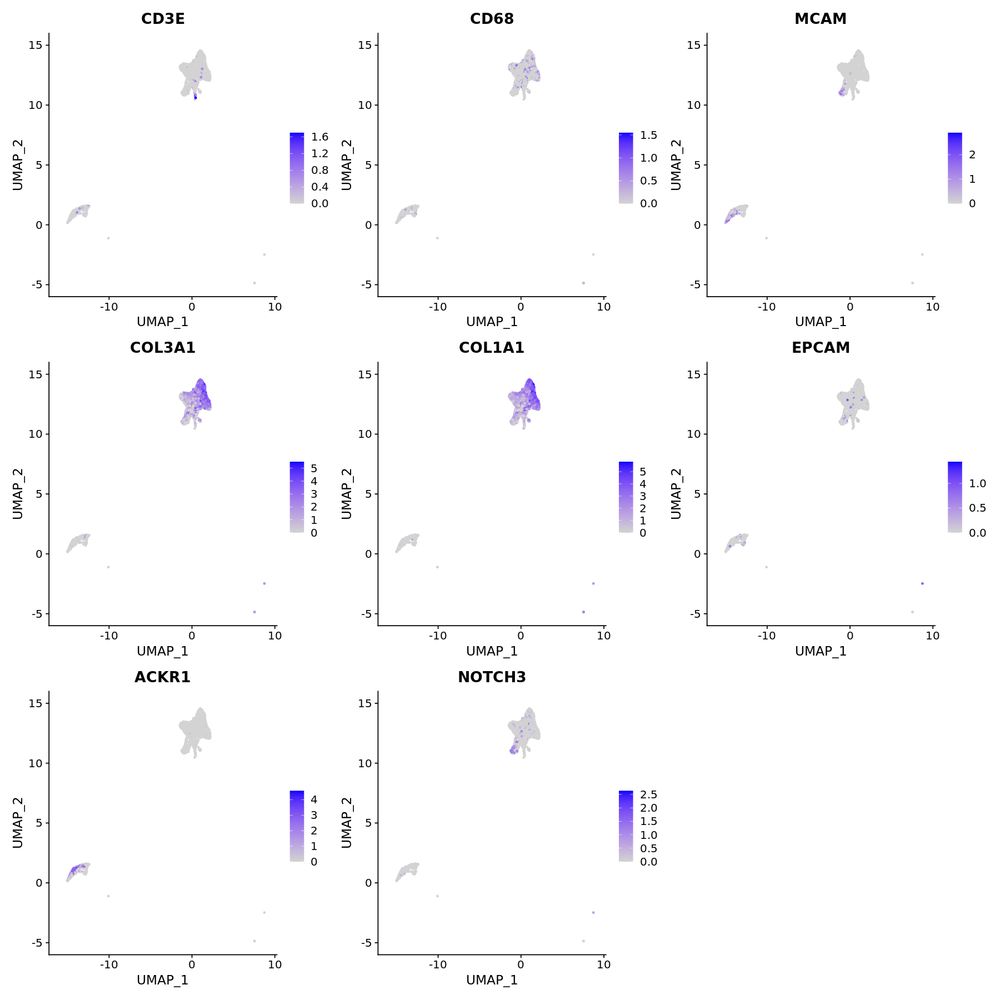

In [48]:
fig.size(15, 15)
FeaturePlot(obj[, i], features = c('CD3E', 'CD68', 'MCAM', 'COL3A1', 'COL1A1', 'EPCAM', 'ACKR1', 'NOTCH3'), ncol = 3, reduction = 'umap', raster = FALSE) 


# Subtype stromal cells

## Isolate stromal cells

In [49]:
sort(unique(obj@meta.data$Cell_type))

[1] "B lymphocytes"     "Endothelial cells" "Epithelial cells" 
[4] "Fibroblasts"       "MAST cells"        "Myeloid cells"    
[7] "T/NK cells"

In [50]:
obj = subset(obj, Cell_type %in% c('Endothelial cells', 'Fibroblasts'))
obj = DietSeurat(obj, layers = c('counts')) 


Warning message:
“Removing 6705 cells missing data for vars requested”
Warning message:
“`invoke()` is deprecated as of rlang 0.4.0.
Please use `exec()` or `inject()` instead.
This warning is displayed once every 8 hours.”
Warning message:
“Resetting the data matrix to the raw counts”


## Remove debris

In [51]:
library(harmony)

Loading required package: Rcpp



Warning message:
“Cannot find a parent environment called Seurat”
Warning message:
“The following arguments are not used: nselect”
Centering and scaling data matrix

PC_ 1 
Positive:  RAMP2, PECAM1, CLDN5, CLEC14A, EGFL7, VWF, TM4SF1, ECSCR, RNASE1, CD93 
	   IFI27, GNG11, AQP1, BCAM, ESAM, PCDH17, PTPRB, CALCRL, CDH5, PLVAP 
	   ARHGAP29, RAMP3, PCAT19, EMCN, GIMAP7, FKBP1A, ADGRL4, LDB2, EPAS1, TSPAN7 
Negative:  DCN, LUM, COL1A2, RARRES2, SERPINF1, FBLN1, COL6A2, PCOLCE, BGN, COL1A1 
	   COL6A3, COL3A1, COL6A1, AEBP1, LGALS3BP, LGALS1, CCDC80, SOD3, CLEC11A, FTH1 
	   VCAN, CTSK, C3, TPM2, FN1, PTGDS, CFH, TIMP1, ISLR, LOXL1 
PC_ 2 
Positive:  ADH1B, A2M, SEPP1, GPC3, GPX3, TCF21, INMT, MGP, SOD3, CFD 
	   G0S2, FHL1, FMO2, FGFR4, FIGF, SCN7A, MAL, PLEKHH2, ADIRF, ABCA8 
	   C7, LIMCH1, TSPAN8, PTGDS, SHISA3, PPP1R14A, NPNT, BMP5, ANGPT1, GPM6B 
Negative:  CTHRC1, COL5A2, THBS2, MMP11, COL12A1, COL1A1, COL11A1, SPARC, COL3A1, SULF1 
	   POSTN, MXRA5, HTRA1, PDPN, COL5A1, CTSK, GJB2,

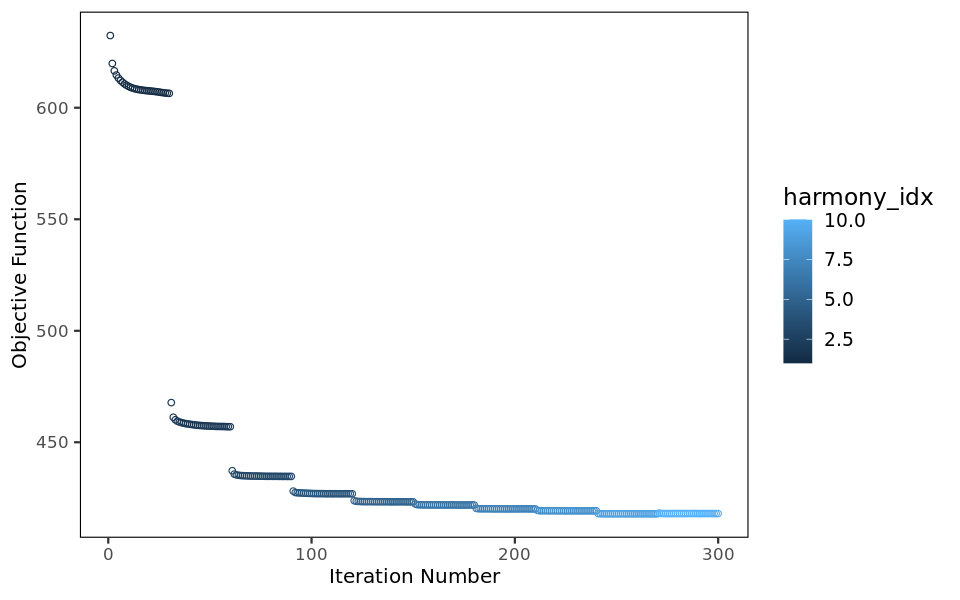

In [52]:
fig.size(5, 8)
.verbose = TRUE
obj = obj %>% 
        Seurat::NormalizeData(scale.factor = median(obj@meta.data$nCount_RNA)) %>% 
        Seurat::FindVariableFeatures() %>% 
        Seurat::ScaleData(verbose = .verbose) %>% 
        Seurat::RunPCA(npcs = 30, verbose = .verbose) %>% 
        RunHarmony(
            'Sample', plot_convergence = TRUE, 
            epsilon.cluster = -Inf, epsilon.harmony = -Inf, 
            max.iter.harmony = 10, max.iter.cluster = 30, 
            theta = 1
        ) 


In [53]:
system.time({
    U <- uwot::umap(obj@reductions$harmony@cell.embeddings, min_dist = 0.3, spread = 1.0, ret_extra = 'fgraph', fast_sgd = TRUE, n_sgd_threads = 40)     
})

colnames(U$embedding) <- c('HUMAP1', 'HUMAP2')
rownames(U$fgraph) <- colnames(U$fgraph) <- Cells(obj)

obj[['humap']] <- Seurat::CreateDimReducObject(
    embeddings = U$embedding,
    assay = 'RNA', 
    key = 'HUMAP_', 
    global = TRUE
)
new_graph <- Seurat::as.Graph(U$fgraph)
DefaultAssay(new_graph) <- DefaultAssay(obj)
obj[['humap_fgraph']] <- new_graph


   user  system elapsed 
  5.441   0.496   2.699 

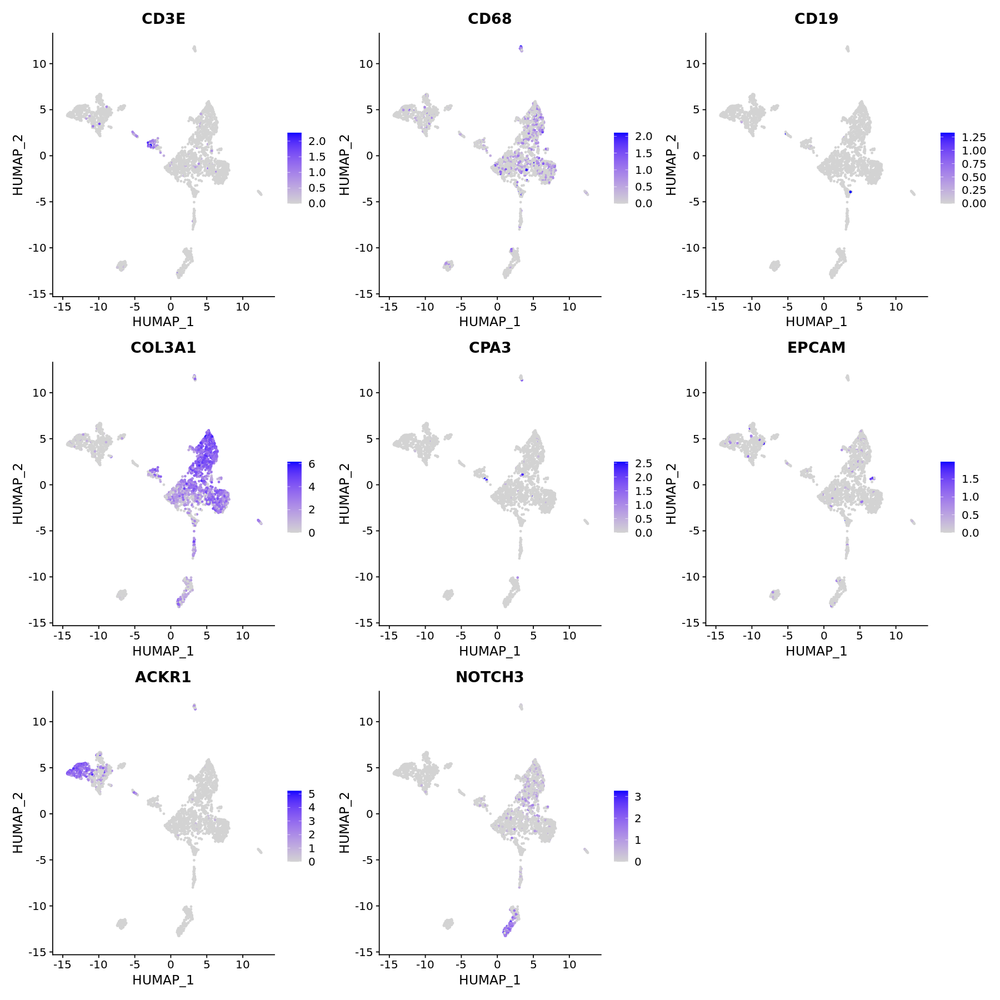

In [60]:
fig.size(15, 15)
FeaturePlot(obj, features = c('CD3E', 'CD68', 'CD19', 'COL3A1', 'CPA3', 'EPCAM', 'ACKR1', 'NOTCH3'), ncol = 3, reduction = 'humap', raster = FALSE)


In [55]:
## Define lots of different resolutions to try out 
resolutions_test <- seq(.01, 0.8, length.out = 5)

## Run FindClusters with multiple cores
system.time({
    suppressWarnings({
        obj <- Seurat::FindClusters(obj, graph.name = 'humap_fgraph', resolution = resolutions_test, verbose = FALSE)        
    })
})


   user  system elapsed 
  0.909  18.389  12.753 

In [56]:
obj@meta.data %>% 
    dplyr::select(matches('humap_fgraph_res')) %>% 
    map_int(nlevels)


humap_fgraph_res.0.01 humap_fgraph_res.0.2075  humap_fgraph_res.0.405 
                      3                      10                      13 
humap_fgraph_res.0.6025    humap_fgraph_res.0.8 
                     15                      17

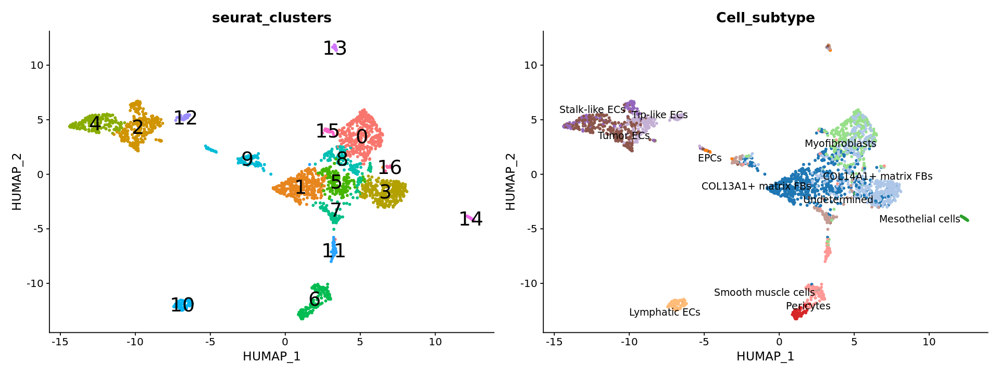

In [65]:
obj@meta.data$seurat_clusters <- obj@meta.data$humap_fgraph_res.0.8

fig.size(6, 16)
DimPlot(obj, reduction = 'humap', group.by = 'seurat_clusters', label = TRUE, pt.size = 1, label.size = 8) + 
    guides(color = 'none') + 
    # scale_color_tableau('Classic 20') + 
    NULL | 
DimPlot(obj, reduction = 'humap', group.by = 'Cell_subtype', label = TRUE, pt.size = 1, label.size = 4, repel = TRUE) + 
    guides(color = 'none') + 
    scale_color_tableau('Classic 20') + 
    NULL


In [58]:
library(presto)
markers = presto::wilcoxauc(obj, 'seurat_clusters')
markers = markers %>% dplyr::mutate(group = factor(group, 0:100)) 


In [59]:
top_markers(markers)

rank,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,CTHRC1,SEPP1,CLEC14A,FBLN1,ACKR1,TNFSF13B,MYL9,RPL21,BGN,CD52,TFF3,MYH11,HLA-E,TYROBP,KRT19,CXCL14,KRT18
2,COL1A1,A2M,IFI27,CCDC80,VWF,TMEM176B,TAGLN,RPLP1,COL3A1,CXCR4,CCL21,ACTA2,HPGD,HLA-DRA,KRT8,TWIST2,VAMP8
3,COL3A1,TCF21,CLDN5,C7,FKBP1A,TMEM176A,ACTA2,RPL13A,COL8A1,CORO1A,FABP5,TPM2,B2M,HLA-DQB1,SLPI,PLPP1,TACSTD2
4,COL1A2,GPC3,RAMP2,C3,RNASE1,C3,TPM2,RPS6,COL6A3,SRGN,FABP4,TAGLN,HLA-B,CD74,CALB2,CYR61,MUC1
5,LGALS1,ADH1B,HLA-B,SERPINF1,CD74,CYP1B1,CALD1,RPL31,COL1A1,CD3D,TFPI,LTBP1,IFI27,HLA-DPB1,MSLN,APOD,KRT19
6,COL6A3,MFAP4,HLA-E,SFRP2,PECAM1,CCL19,MYH11,RPL23A,COL10A1,BTG1,MMRN1,MYLK,RAMP2,HLA-DQA1,PDZK1IP1,TMEM176B,KRT8
7,COL5A2,INMT,RNASE1,CST3,RAMP3,EMILIN1,SOD3,FTL,TIMP1,TRAC,GNG11,MYL9,EDNRB,LYZ,PRG4,CHN1,TRAF4
8,CTSK,CFD,PECAM1,FTL,TM4SF1,TIMP1,NDUFA4L2,RPL13,COL1A2,LTB,ANXA2,CALD1,ITM2B,C1orf162,KRT18,C1S,SFTA2
9,VCAN,LBH,EGFL7,GPNMB,ECSCR,C1S,TINAGL1,RPS27,SFRP4,LAPTM5,ECSCR,DSTN,EGFL7,FCER1G,TFPI2,LTBP2,CRIP1


In [71]:
remove = c('13', '9', '16', '7')
# remove = c('15', '14', '13', '12', '9')
keep = setdiff(as.character(unique(markers$group)), remove)


In [72]:
obj = subset(obj, seurat_clusters %in% keep)

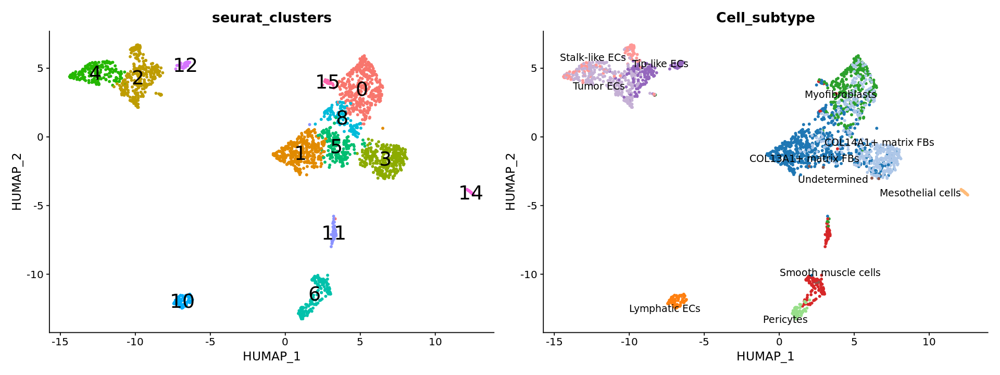

In [73]:
fig.size(6, 16)
DimPlot(obj, reduction = 'humap', group.by = 'seurat_clusters', label = TRUE, pt.size = 1, label.size = 8) + 
    guides(color = 'none') + 
    # scale_color_tableau('Classic 20') + 
    NULL | 
DimPlot(obj, reduction = 'humap', group.by = 'Cell_subtype', label = TRUE, pt.size = 1, label.size = 4, repel = TRUE) + 
    guides(color = 'none') + 
    scale_color_tableau('Classic 20') + 
    NULL


In [103]:
obj = DietSeurat(obj, layers = 'counts')

Warning message:
“Resetting the data matrix to the raw counts”


## Subtypes

In [74]:
library(harmony)

Warning message:
“Cannot find a parent environment called Seurat”
Warning message:
“The following arguments are not used: nselect”
Centering and scaling data matrix

PC_ 1 
Positive:  DCN, LUM, COL1A2, RARRES2, SERPINF1, COL6A2, FBLN1, PCOLCE, BGN, COL1A1 
	   MMP2, COL6A3, MFAP4, COL3A1, COL6A1, AEBP1, LGALS3BP, CCDC80, LGALS1, CLEC11A 
	   TMEM176B, SOD3, TMEM176A, VCAN, CTSK, FN1, C3, CFH, TPM2, PTGDS 
Negative:  RAMP2, PECAM1, CLDN5, EGFL7, CLEC14A, TM4SF1, VWF, ECSCR, RNASE1, CD93 
	   IFI27, GNG11, HLA-E, BCAM, ESAM, AQP1, PCDH17, PTPRB, CALCRL, CDH5 
	   ARHGAP29, PLVAP, PCAT19, FKBP1A, GIMAP7, RAMP3, EMCN, ADGRL4, CD74, EPAS1 
PC_ 2 
Positive:  A2M, ADH1B, GPX3, SEPP1, TCF21, GPC3, INMT, MGP, SOD3, CFD 
	   FMO2, G0S2, FHL1, FGFR4, MAL, SCN7A, FIGF, MFAP4, C7, PLEKHH2 
	   ABCA8, ADIRF, LIMCH1, TSPAN8, PTGDS, TGM2, SHISA3, PPP1R14A, NPNT, BMP5 
Negative:  CTHRC1, COL5A2, MMP11, COL12A1, THBS2, COL11A1, SPARC, SULF1, POSTN, COL1A1 
	   COL3A1, PDPN, MXRA5, GJB2, COL5A1, SDC1, AD

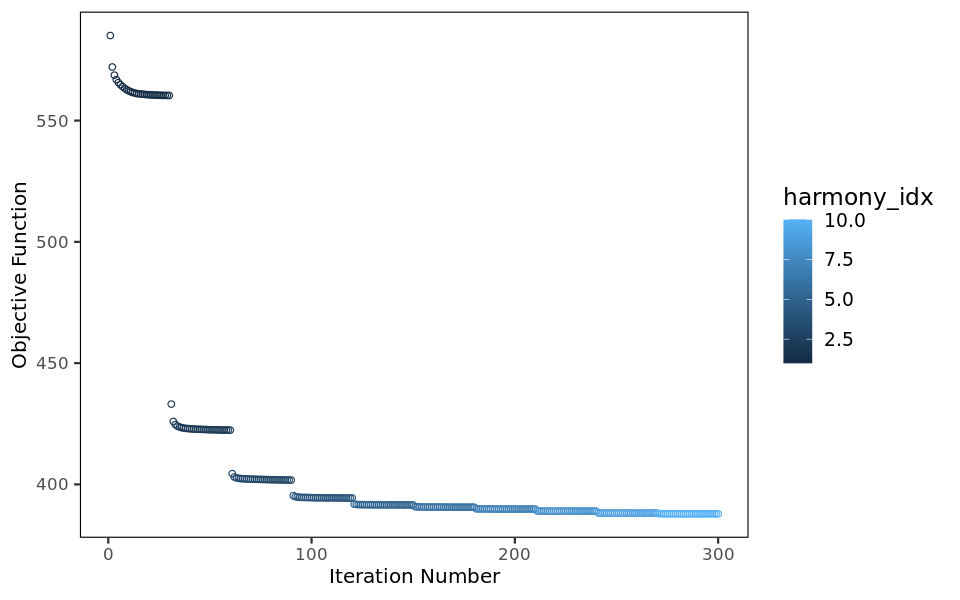

In [75]:
fig.size(5, 8)
.verbose = TRUE
obj = obj %>% 
        Seurat::NormalizeData(scale.factor = median(obj@meta.data$nCount_RNA)) %>% 
        Seurat::FindVariableFeatures() %>% 
        Seurat::ScaleData(verbose = .verbose) %>% 
        Seurat::RunPCA(npcs = 30, verbose = .verbose) %>% 
        RunHarmony(
            'Sample', plot_convergence = TRUE, 
            epsilon.cluster = -Inf, epsilon.harmony = -Inf, 
            max.iter.harmony = 10, max.iter.cluster = 30, 
            theta = 1
        ) 


In [76]:
system.time({
    U <- uwot::umap(obj@reductions$harmony@cell.embeddings, min_dist = 0.3, spread = 1.0, ret_extra = 'fgraph', fast_sgd = TRUE, n_sgd_threads = 40)     
})

colnames(U$embedding) <- c('HUMAP1', 'HUMAP2')
rownames(U$fgraph) <- colnames(U$fgraph) <- Cells(obj)

obj[['humap']] <- Seurat::CreateDimReducObject(
    embeddings = U$embedding,
    assay = 'RNA', 
    key = 'HUMAP_', 
    global = TRUE
)
new_graph <- Seurat::as.Graph(U$fgraph)
DefaultAssay(new_graph) <- DefaultAssay(obj)
obj[['humap_fgraph']] <- new_graph


   user  system elapsed 
  4.931   0.434   2.453 

In [77]:
## Define lots of different resolutions to try out 
resolutions_test <- seq(.01, 0.8, length.out = 5)

## Run FindClusters with multiple cores
system.time({
    suppressWarnings({
        obj <- Seurat::FindClusters(obj, graph.name = 'humap_fgraph', resolution = resolutions_test, verbose = FALSE)        
    })
})


   user  system elapsed 
  0.789  17.848  12.214 

In [78]:
obj@meta.data %>% 
    dplyr::select(matches('humap_fgraph_res')) %>% 
    map_int(nlevels)


humap_fgraph_res.0.01 humap_fgraph_res.0.2075  humap_fgraph_res.0.405 
                      5                       8                      11 
humap_fgraph_res.0.6025    humap_fgraph_res.0.8 
                     14                      14

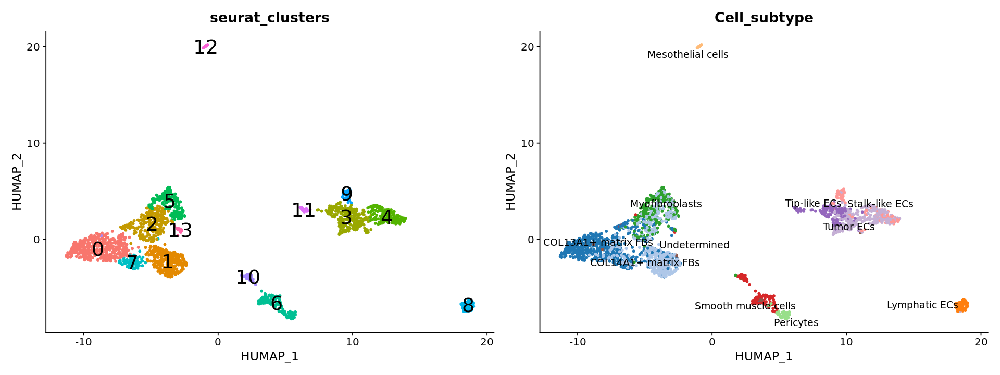

In [83]:
obj@meta.data$seurat_clusters <- obj@meta.data$humap_fgraph_res.0.8

fig.size(6, 16)
DimPlot(obj, reduction = 'humap', group.by = 'seurat_clusters', label = TRUE, pt.size = 1, label.size = 8) + 
    guides(color = 'none') + 
    # scale_color_tableau('Classic 20') + 
    NULL | 
DimPlot(obj, reduction = 'humap', group.by = 'Cell_subtype', label = TRUE, pt.size = 1, label.size = 4, repel = TRUE) + 
    guides(color = 'none') + 
    scale_color_tableau('Classic 20') + 
    NULL


In [80]:
library(presto)
markers = presto::wilcoxauc(obj, 'seurat_clusters')
markers = markers %>% dplyr::mutate(group = factor(group, 0:100)) 


In [81]:
top_markers(markers)

rank,0,1,2,3,4,5,6,7,8,9,10,11,12,13
<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,A2M,FBLN1,COL3A1,GNG11,ACKR1,COL1A1,MYL9,CCL19,TFF3,ARGLU1,MYH11,HLA-E,KRT19,CXCL14
2,SEPP1,CCDC80,CTHRC1,IFI27,VWF,CTHRC1,TAGLN,CTSS,CCL21,CLEC14A,ACTA2,HPGD,KRT8,TWIST2
3,ADH1B,C7,BGN,CLEC14A,FKBP1A,LGALS1,ACTA2,C3,FABP5,IFI27,TPM2,B2M,SLPI,APOD
4,TCF21,C3,COL6A3,CLDN5,RAMP3,COL3A1,TPM2,TNFSF13B,FABP4,CTNNAL1,TAGLN,HLA-B,CALB2,PLPP1
5,CFD,SERPINF1,COL1A1,RAMP2,CD74,COL1A2,CALD1,TYMP,TFPI,CLDN5,LTBP1,IFI27,MSLN,TMEM176B
6,GPC3,FTL,COL8A1,HLA-A,RNASE1,COL5A2,MYH11,CYP1B1,ANXA2,TNFSF10,MYLK,RAMP2,PDZK1IP1,CYR61
7,MFAP4,CST3,COL1A2,EGFL7,PECAM1,CTSK,SOD3,CTSH,MMRN1,SRGN,MYL9,EDNRB,KRT18,CHN1
8,INMT,SFRP2,LGALS1,HLA-E,TM4SF1,MXRA5,NDUFA4L2,TMEM176B,GNG11,RNASE1,DSTN,ITM2B,PRG4,LSAMP
9,LBH,GPNMB,SFRP4,PECAM1,ECSCR,VCAN,TINAGL1,VCAM1,ECSCR,EPAS1,CALD1,EGFL7,TFPI2,PTGDS


In [114]:
## Remove more debris? 
# obj = subset(obj, seurat_clusters %in% setdiff(as.character(unique(obj@meta.data$seurat_clusters)), '8'))


CCL19 is super specific to a subtype of fibroblast! 

Not pericytes, not ECs, but fibroblasts! 



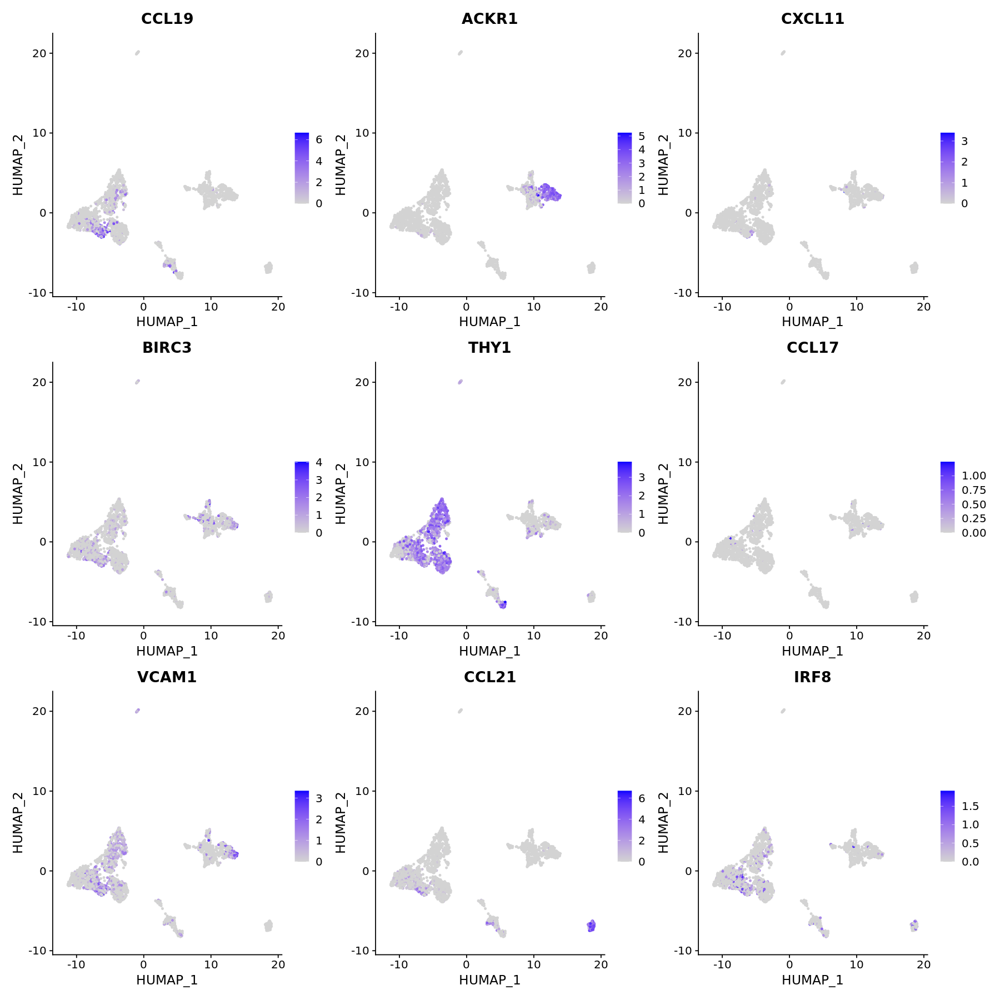

In [119]:
fig.size(15, 15)
FeaturePlot(obj, features = c('CCL19', 'ACKR1', 'CXCL11', 'BIRC3', 'THY1', 'CCL17', 'VCAM1', 'CCL21', 'IRF8'), ncol = 3, reduction = 'humap', raster = FALSE, )


## Get DEGs

In [85]:
meta_data = obj@meta.data
meta_data$cluster = meta_data$seurat_clusters
meta_data$library = meta_data$Sample
counts = counts[, rownames(meta_data)]

In [89]:
library(singlecellmethods)
library(presto)
library(lme4)
library(future)
library(furrr)
plan(multicore)

In [87]:
genes_merfish = unique(fread('share/cells/markers_lvl1.csv')$feature)

In [88]:
genes_merfish = intersect(genes_merfish, rownames(obj))

In [90]:
pb <- presto::collapse_counts(
    counts, meta_data, 
    c('library', 'cluster'), 
    min_cells_per_group = 10, 
    get_norm = TRUE
)  

system.time({
    suppressWarnings({
        presto_res <- presto.presto(
            y ~ 1 + (1|cluster) + (1|cluster:library) + (1|library) + offset(logUMI), 
            pb$meta_data, 
            pb$counts_mat,
            features = genes_merfish, ## only care about these 
            size_varname = 'logUMI', 
            effects_cov = c('cluster'),
            ncore = 5, 
            min_sigma = .05, 
            family = 'poisson',
            nsim = 1000
        ) 
    })
})

contrasts_mat <- make_contrast.presto(presto_res, 'cluster')
effects_marginal <- contrasts.presto(presto_res, contrasts_mat, one_tailed = TRUE) %>% 
    dplyr::mutate(cluster = contrast) %>% 
    dplyr::mutate(
        ## convert stats to log2 for interpretability 
        logFC = sign(beta) * log2(exp(abs(beta))),
        SD = log2(exp(sigma)),
        zscore = logFC / SD
    ) %>% 
    dplyr::select(cluster, feature, logFC, SD, zscore, pvalue) %>% 
    arrange(pvalue)
effects_marginal$fdr <- p.adjust(effects_marginal$pvalue, method = 'BH')


CAREFUL: get_norm makes very strong assumptions about data

CAUTION: if using GLMM, make sure your counts are integers!

Joining with `by = join_by(grpvar_orig)`


   user  system elapsed 
412.876  14.675 110.262 

In [91]:
# presto::toptable.presto(effects_marginal)

In [92]:
# effects_marginal %>% filter(feature == 'TIMP1')

In [95]:
effects_marginal %>% 
    filter(cluster == '4') %>% 
    head(10)


cluster,feature,logFC,SD,zscore,pvalue,fdr
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
4,HIF1A,0.8215503,0.2428791,3.382549,0.0003590826,0.2382745
4,SPP1,2.8809071,0.9848025,2.925365,0.0017202605,0.3655554
4,CD74,1.8988997,0.7128366,2.663864,0.0038624401,0.4419007
4,TGFBR3,1.8558688,0.7063423,2.627435,0.0043015611,0.4419007
4,HLA-DRA,1.6670159,0.6503815,2.563136,0.0051865756,0.5116941
4,ICAM1,1.7071228,0.6769019,2.521965,0.0058350706,0.5343487
4,BMPR2,1.4443394,0.5882983,2.455114,0.0070419959,0.5558147
4,KLF2,1.0363545,0.4232660,2.448471,0.0071732000,0.5581962
4,DUSP6,1.6319429,0.7080513,2.304837,0.0105878443,0.6499760


In [100]:
effects_marginal %>% 
    split(.$cluster) %>% 
    map(dplyr::arrange, -zscore) %>% 
    map(filter, pvalue < .05) %>% 
    map(head, 5) %>% 
    identity()


cluster,feature,logFC,SD,zscore,pvalue,fdr
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0,SEPP1,2.4796329,0.7502016,3.305289,0.0004743927,0.2382745
0,CCL2,0.9184546,0.3637318,2.525088,0.0057834722,0.5343487
0,G0S2,3.4959104,1.4029581,2.491814,0.0063546324,0.5401438
0,SLC40A1,2.1066578,0.8545776,2.465145,0.0068478906,0.5558147
0,CCL13,3.7965352,1.6470452,2.305058,0.0105816559,0.6499760
cluster,feature,logFC,SD,zscore,pvalue,fdr
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,SEPP1,1.8613871,0.5240167,3.552152,0.0001910467,0.1759222
1,APOE,2.4830193,0.8563700,2.899470,0.0018689699,0.3824466


In [120]:
table(obj@meta.data$Cell_subtype)


COL13A1+ matrix FBs COL14A1+ matrix FBs       Lymphatic ECs   Mesothelial cells 
                660                 371                  74                  21 
     Myofibroblasts           Pericytes Smooth muscle cells      Stalk-like ECs 
                274                  53                 141                 102 
       Tip-like ECs           Tumor ECs        Undetermined 
                159                 282                  10 

## Cache

In [101]:
obj %>% DietSeurat(layers = 'counts') %>% saveRDS('data/stromal_ref_lee_lung.rds')


Warning message:
“Resetting the data matrix to the raw counts”


In [102]:
fwrite(effects_marginal, 'data/stromal_ref_lee_lung_markers.csv')

In [103]:
x = fread('share/cells/markers_lvl2.csv')

In [116]:
library(ggrepel)

Warning message:
“ggrepel: 441 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


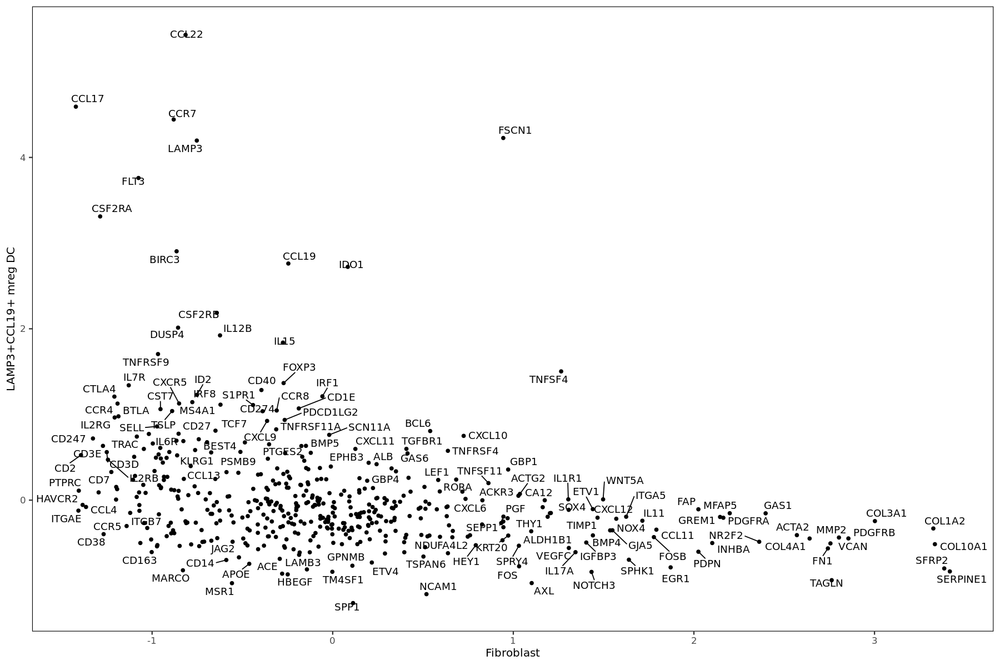

In [117]:
x[cluster %in% c('Fibroblast', 'LAMP3+CCL19+ mreg DC')][, .(cluster, feature, logFC)] %>% 
    tidyr::spread(cluster, logFC) %>% 
    ggplot(aes(Fibroblast, `LAMP3+CCL19+ mreg DC`)) + 
        geom_point() + 
        geom_text_repel(aes(label = feature)) + 
        NULL


In [105]:
table(x$cluster)


                           B               CD1C+ITGAX+ DC 
                         479                          479 
                       CD4 T                        CD8 T 
                         479                          479 
          CXCL10+ Macrophage                CXCL13+ CD4 T 
                         479                          479 
               CXCL13+ CD8 T                   Epithelial 
                         479                          479 
        FCN1+LYZ+ Macrophage                   Fibroblast 
                         479                          479 
                    FLT3+ DC       FOLR2+CD14+ Macrophage 
                         479                          479 
                         ILC         LAMP3+CCL19+ mreg DC 
                         479                          479 
              LAMP3+CD1C+ DC            MARCO+ Macrophage 
                         479                          479 
                        Mast            MERTK+ Macropha